In [82]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [83]:
#python v3.11.3

import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)



import os
import datetime

import numpy as np #v1.25.0
import pandas as pd #v2.0.3
import scipy #v1.10.1
import scipy.stats as stats

import seaborn as sns #v0.13.0
import matplotlib as mpl #v3.8.1
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates

#import matplotlib.spines as spines
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection

import importlib
# these files should be in the same directory as this Jupyter notebook
from loader import *
import analysis_functions
from analysis_functions import *
from plot_functions import *

# to set styles for plotting
mpl.style.use(r"C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\mouse_analysis\full_trial_analysis\mouse_analysis.mplstyle")

#to suppress inaccurate pandas reassignment warnings
pd.options.mode.chained_assignment = None  # default='warn'

# 1. Load Files

### Parameters

In [84]:
# directory files are pulled from
csv_directory = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals'
dcz_dir = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals\\dcz'

all_reward = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals\\all_reward'

# file containing information about animals (cage, age, sex, strain) - must have Animal ID column
metadata_file = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\eunsol_metadata.xlsx'
dcz_meta = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\eunsol_metadata.xlsx'

lesion_meta = r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\lesion\lesion metadata.xlsx'
lesion_dir = r'C:\Users\swind\Documents\lab_work\Barth\behavior_analysis\lesion\Surgery done by Kate'

mins = {
        "min_trials": 0,  # minimum number of trials in a bin to keep
        "min_blank": 0,   # minimum number of water trials
        "min_stimulus": 0 # minimum number of water trials 
        }

keys = {
    "millis bin":"puff delta",
    "Time (ms)":"Time (ms)",
    "stimulus type":"stimulus",
    "water delivery":"water",
    "trial no":"trial no",
    "time bin":"delta",
    "licks":"lick",
    "timestamp":"timestamp",
    "delay":"delay",
    "acc":"acc"
}

index = ["condition", "animal"]
keep = ["Age", "Sex", "Strain", "acc", "Cage"]
values = ["lick", "pokestart"]

### 1.2 Load data

In [85]:
metadata = pd.read_excel(metadata_file)
dcz_metadata = pd.read_excel(dcz_meta)
lesion_metadata = pd.read_excel(lesion_meta)

# this will load all conditions in a directory of multiple conditions
df = []
for d in os.listdir(csv_directory):
    print(f'starting {d}')
    cond = make_condition_df(csv_directory +'\\' + d, d, metadata, keep)
    df.append(cond)

print("starting DCZ")
dcz = []
for d in os.listdir(dcz_dir):
    cond = make_condition_df(dcz_dir +'\\' + d, d, dcz_metadata, keep)
    dcz.append(cond)

print('starting lesion')
lesion = []
for d in os.listdir(lesion_dir):
    cond = make_condition_df(lesion_dir +'\\' + d, d, lesion_metadata, ['acc','id', 'Cage', 'Date', 'Sex'])
    dcz.append(cond)

print("combine all")
df = pd.concat(df + dcz + lesion)

keep = keep + ["stimulus", "water", "type"]

starting 100acc80acc
starting all_reward
starting dcz
0.1mg DCZ hm4di has no behavior files
0.1mg DCZ mcherry has no behavior files
0.5mg DCZ mcherry has no behavior files
0.5mg-1mg DCZ hm4di has no behavior files
starting hm4di_cno
starting mcherry_cno
starting SAT
starting DCZ
starting lesion
combine all


In [86]:
def pokestart(x):
    gppoke = x['poke'].diff().replace({-1:0})
    gppoke.iloc[0] = x.iloc[0]['poke']
    return gppoke
poke = df.groupby(['condition', 'animal', 'trial no']).apply(pokestart)
poke

condition        animal  trial no        
0.1mg DCZ hm4di  OHQ3    1         0         1.0
                                   1         0.0
                                   2         0.0
                                   3         0.0
                                   4         0.0
                                            ... 
mcherry_cno      NIO16   705       418684    0.0
                                   418685    0.0
                                   418686    0.0
                                   418687    0.0
                                   418688    0.0
Name: poke, Length: 7417112, dtype: float64

In [ ]:
df['pokestart'] = poke.reset_index()['poke']

In [87]:
# column rename for convenience
df["depress"] = df["condition"]
df["condition"] = df["condition"].replace({"hm4di_cno": "hM4Di + CNO", "mcherry_cno": "mCherry + CNO", 
                         '0.1mg DCZ hm4di': "hM4Di + DCZ", 
                         '0.1mg DCZ mcherry': "mCherry + DCZ", 
                         '0.5mg DCZ mcherry':"mCherry + DCZ",  
                         '0.5mg-1mg DCZ hm4di': "hM4Di + DCZ",
                         "all_reward": "100% ACC, 80% SAT",
                         "SAT": "Control", 'Ipsi-lesion':'Ipsi-lesion', 'Contra-lesion':'Contra-lesion'})

keep = keep + ["depress"]

# 2. Lick Frequency Analysis

All plotting is done using a combination of the
`seaborn` and `matplotlib` modules.

## 2.1 Anticipatory licking



### 2.1.1 Analysis, 4h bins

Here grouped by 4 hour bins. The range `r` is inclusive on both sides, here (700, 1000).

In [88]:
values = ['lick','poke']

In [89]:
time_bin = 4*60 # minutes
r = (700, 1000)
keys["millis bin"] = None
ant_data = bin_lickfreq(df, r, time_bin, keys, keep, values)

antkeep = keep + ["Time (hr)", "delta", "Day", "day_delta"]

animal
210219_JQZ_3M_Kendall        2021-02-19 12:00:00
210219_JQZ_4M_Khloe          2021-02-19 12:00:00
210219_JQZ_5M_Kanye (ispi)   2021-02-19 12:00:00
210306_JQZ1F_Kanye           2021-03-06 12:00:00
210406_JUR_1F_Kylie          2021-04-06 12:00:00
                                     ...        
PIU9                         2024-01-06 12:00:00
PNL1                         2024-01-24 12:00:00
PNL2                         2024-01-24 12:00:00
PNL3                         2024-01-27 12:00:00
PNL4                         2024-01-27 12:00:00
Name: trial start, Length: 105, dtype: datetime64[ns]
animal
210219_JQZ_3M_Kendall        2021-02-19 12:00:00
210219_JQZ_4M_Khloe          2021-02-19 12:00:00
210219_JQZ_5M_Kanye (ispi)   2021-02-19 12:00:00
210306_JQZ1F_Kanye           2021-03-06 12:00:00
210406_JUR_1F_Kylie          2021-04-06 12:00:00
                                     ...        
PIU9                         2024-01-06 12:00:00
PNL1                         2024-01-24 12:00:00
P

In [90]:
keys["time bin"] = "delta"
keys["millis bin"] = None
ant_means, counts, ant_perf  = agg(ant_data, keys, index, antkeep, values)
daytots = sum_trials(counts, index + ["Day"], [],"trial no")
hourtots = sum_trials(counts, index + ["Time (hr)"], [],"trial no")

In [ ]:
ant_poke_perf = performance(data_mean, index_timebin, kp, stimulus, key_dict["licks"], 
                       cond0, cond1)


NameError: name 'data_mean' is not defined

In [91]:
mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials
keys["time bin"] = "delta"
keys["millis bin"] = None

ant_data_filtered = drop_group(ant_data, mins, keys, "trial no", index, antkeep)
antfiltmeans, filtcounts, antfiltperf = agg(ant_data_filtered, keys, index, antkeep, values)
daytotsfilt = sum_trials(filtcounts, index + ["Day"], ['Age', 'Sex', 'Cage','depress'],"trial no")
hourtotsfilt = sum_trials(filtcounts, index + ["Time (hr)"], ['Age', 'Sex', 'Cage', 'depress'],"trial no")

In [139]:
antkeep

['Age',
 'Sex',
 'Strain',
 'acc',
 'Cage',
 'stimulus',
 'water',
 'type',
 'depress',
 'Time (hr)',
 'delta',
 'Day',
 'day_delta']

In [141]:
parts = 5 # number of partitions to divide each day's trials into 
nth_part = 5 # which partition of trials to get (1-indexed)
nth_part_data = get_nth_part_day(ant_data_filtered, parts, nth_part)

keys["time bin"] = "day_delta"
keys['millis bin'] = None
nthpart_lickfreq, nthpart_counts, nthpart_perf = agg(nth_part_data, keys, index, antkeep, values)

nthpart_lickfreq = nthpart_lickfreq.set_index(['animal', 'Day'])
nthpart_lickfreq = nthpart_lickfreq[nthpart_lickfreq.groupby(['animal', 'Day']).count()['lick'] == 2]
nthpart_lickfreq = nthpart_lickfreq.reset_index()


#### Trial counts

Number of animals with data per timebin

In [ ]:
num_per_timebin = counts.groupby(["condition", "animal", "Time (hr)"]).first().reset_index().groupby(["condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin.set_index(["condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

In [ ]:
num_per_timebin_filt = filtcounts.groupby(["condition", "animal", "Time (hr)"]).first().reset_index().groupby(["condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin_filt.set_index(["condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

Total number of animals per condition

In [ ]:
num_per_timebin.groupby("condition")["animal"].max().to_clipboard()

In [ ]:
num_per_timebin_filt.groupby("condition")["animal"].max().to_clipboard()

Average number of trials in a timebin by condition

In [ ]:
hourtots.groupby(["condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

In [ ]:
hourtotsfilt.groupby(["condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

Number of trials in a timebin by animal at t=0-4 hours

In [ ]:
at0 = counts[counts["Time (hr)"] == 0][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0.loc[:, ("trial no", "sum")] = at0.loc[:, ("trial no", "blank")] + at0.loc[:, ("trial no", "stimulus")]
at0.stack(level="stimulus").unstack(level=["condition", "animal"]).to_clipboard()

In [ ]:
at0filt = filtcounts[filtcounts["Time (hr)"] == -4][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0filt.loc[:, ("trial no", "sum")] = at0filt.loc[:, ("trial no", "blank")] + at0filt.loc[:, ("trial no", "stimulus")]
at0filt.stack(level="stimulus").unstack(level=["condition", "animal"])

trial no                                                \
condition 100% ACC, 80% SAT                                                 
animal                NKZ10 NKZ3 NKZ7 NLB1 NLB10 NLB3 NLG3 NLN3 NLN5 NLV3   
stimulus                                                                    
blank                    17   10    6   11     3    8    2   13   12    1   
stimulus                 52   28   21   39    17   39   22   25   48   33   
sum                      69   38   27   50    20   47   24   38   60   34   

           ...                                                               \
condition  ... mCherry + CNO                  mCherry + DCZ                   
animal     ...          NCY6 NDR1 NIO15 NIO16          OKN2 OWY6 PIE8 PIT14   
stimulus   ...                                                                
blank      ...             6   10     4     4             4    4    6     4   
stimulus   ...            39   25    12    13            24   22   31    23   
sum        ...            45   35    16    17            28   26   37    27   

                       
condition              
animal    PIT15 PIT17  
stimulus               
blank        22     2  
stimulus     74    16  
sum          96    18  

[3 rows x 54 columns]

Number of trials in all timebins by animal and condition

In [ ]:
counts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [ ]:
filtcounts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [ ]:
hourtots[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

In [ ]:
hourtotsfilt[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

### 2.1.2 Plotting, unfiltered

Lick frequency, performance, and trial no plots for all animals

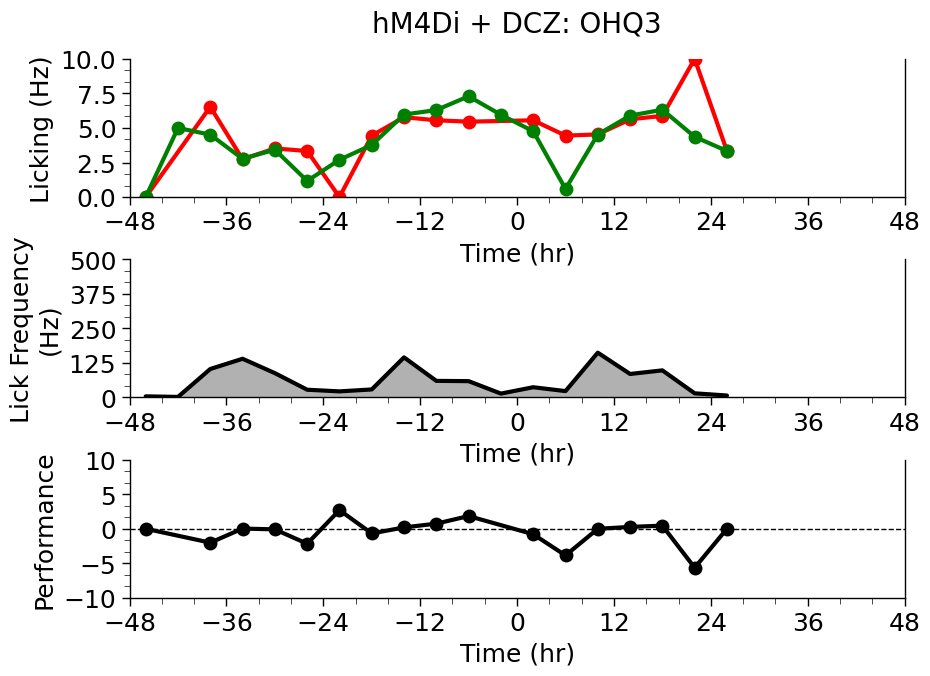

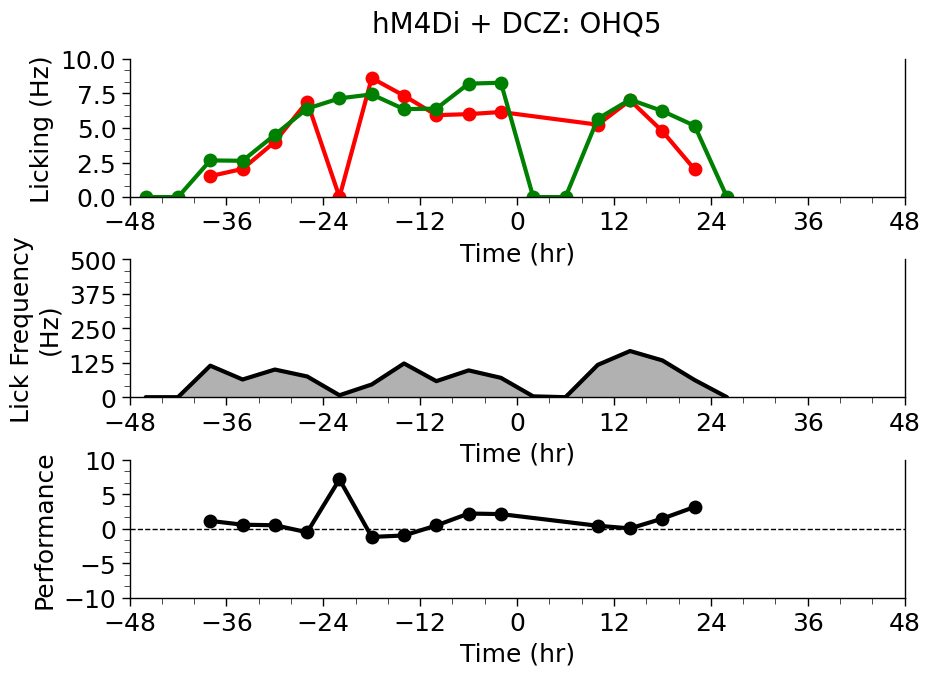

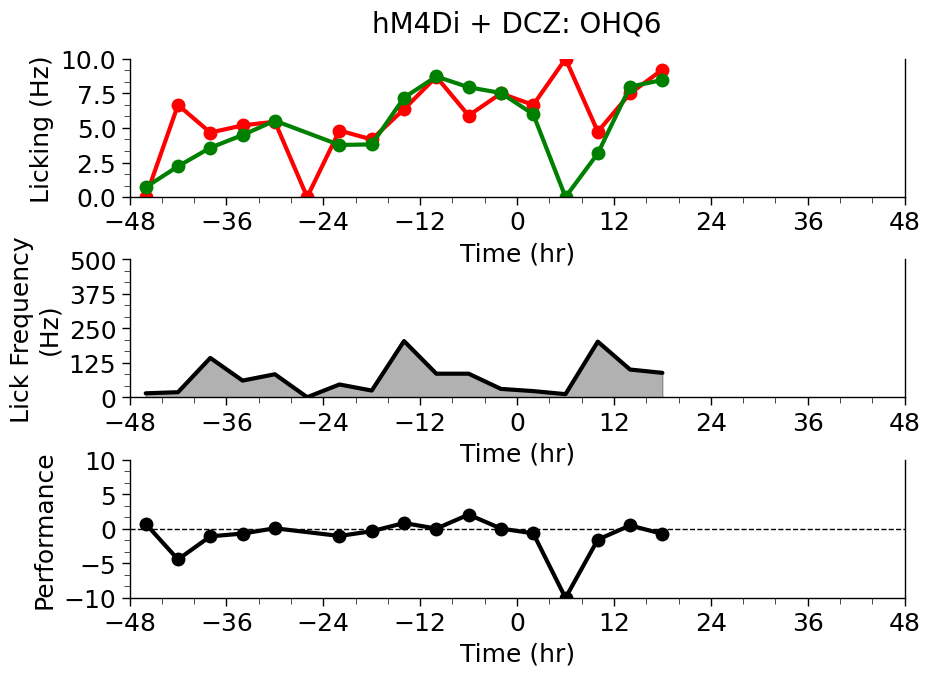

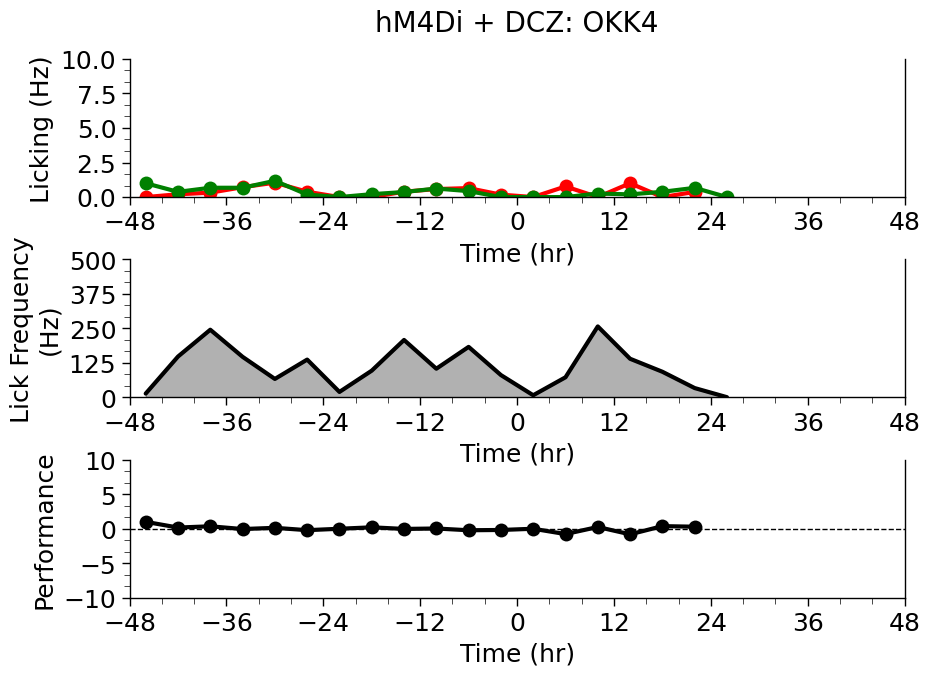

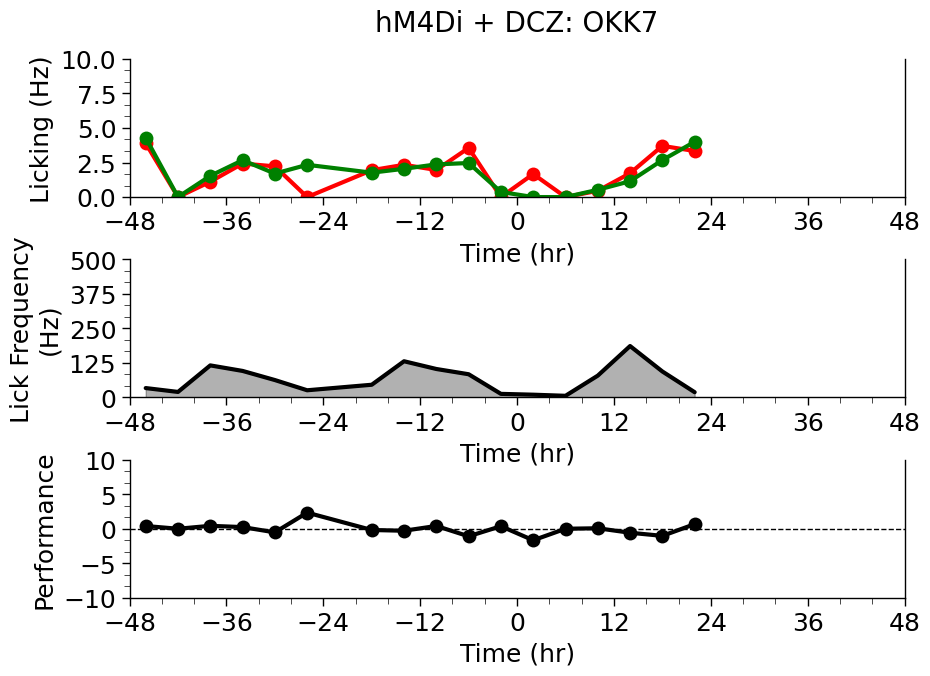

...

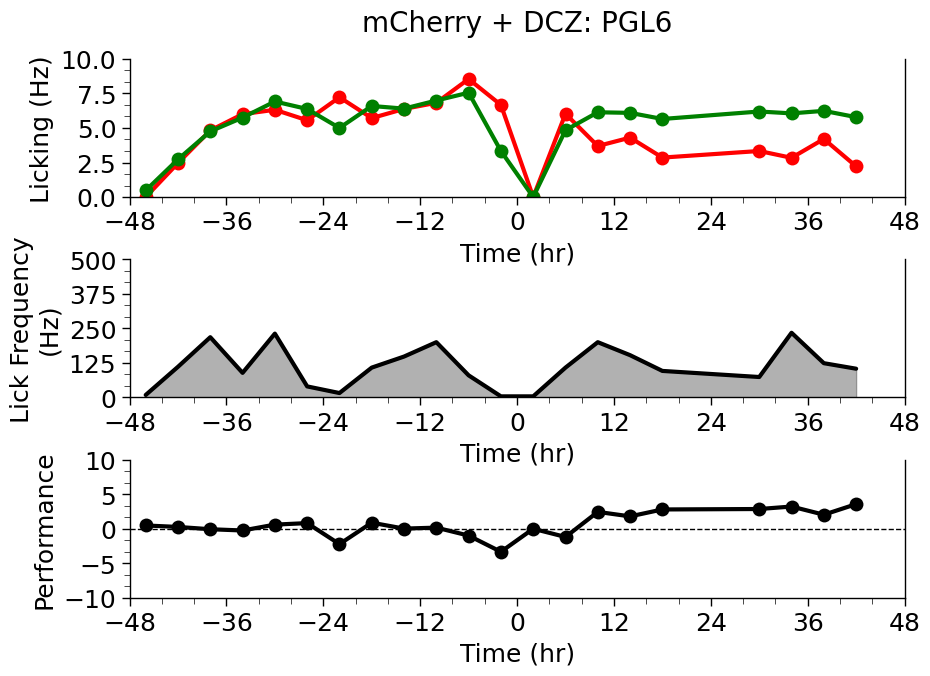

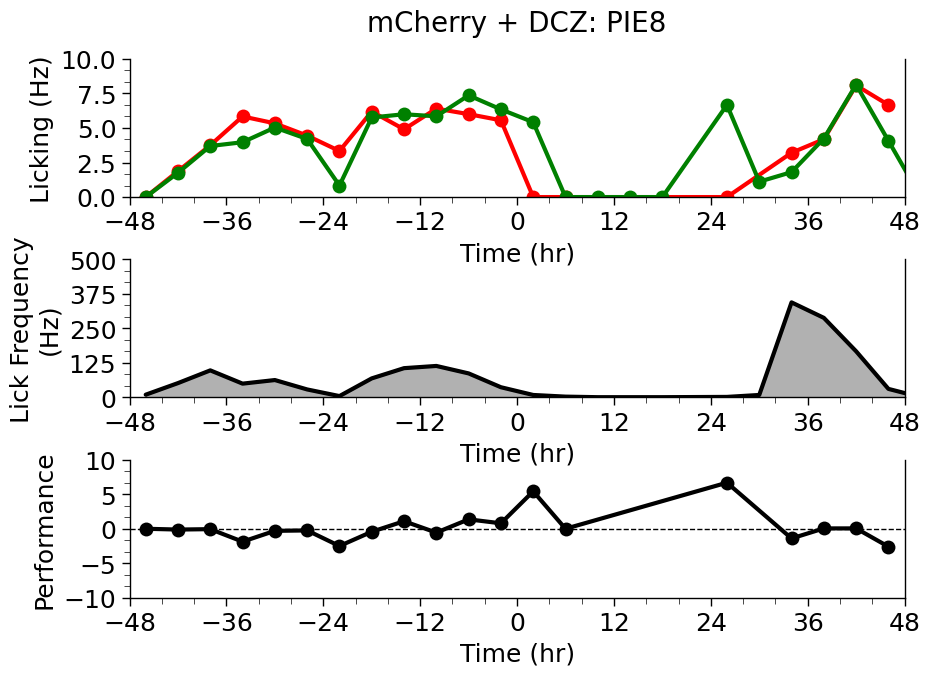

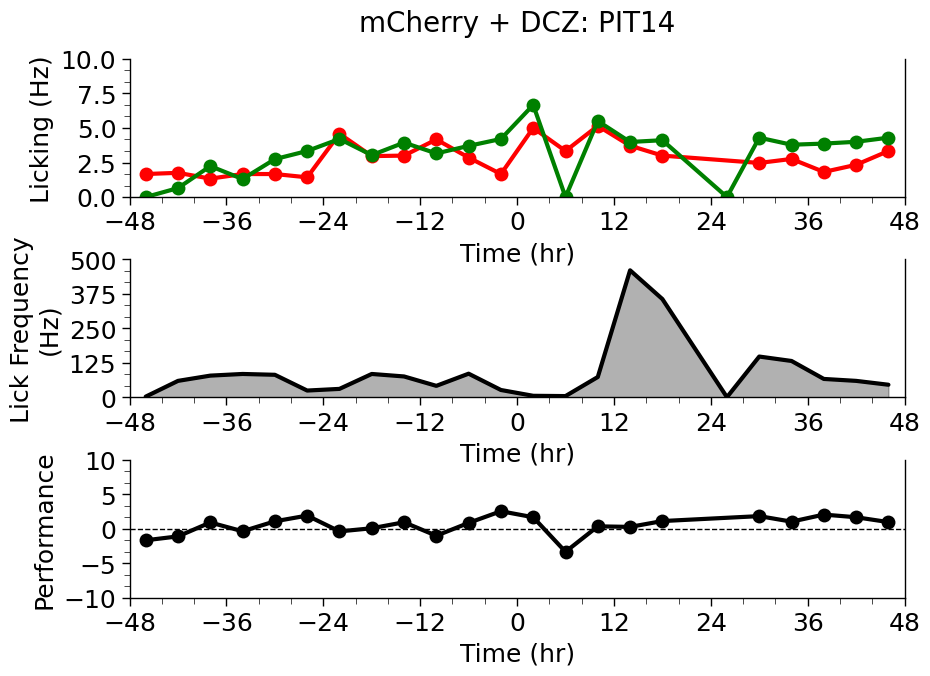

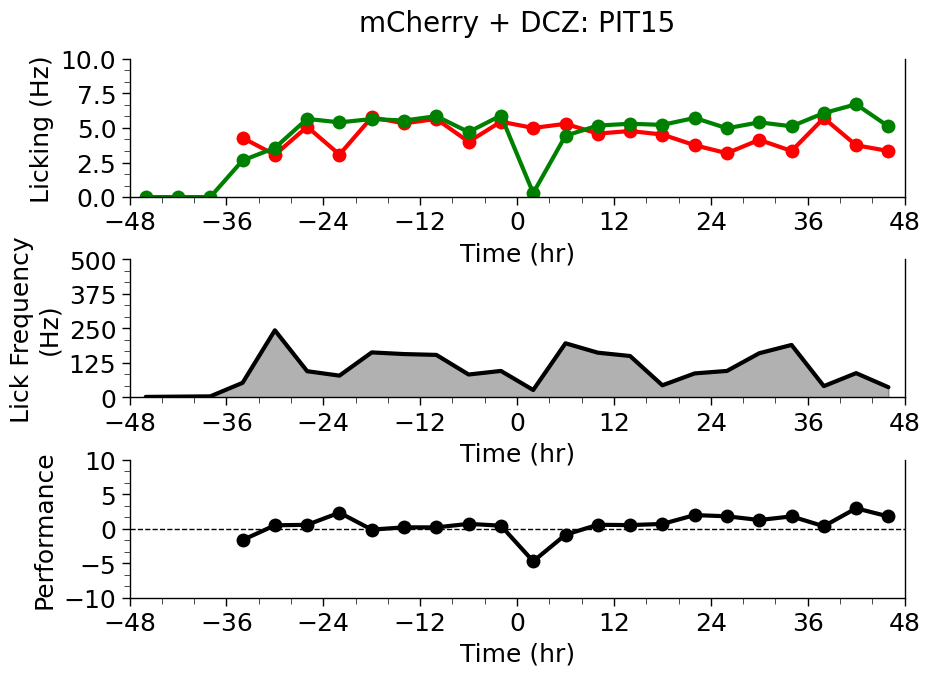

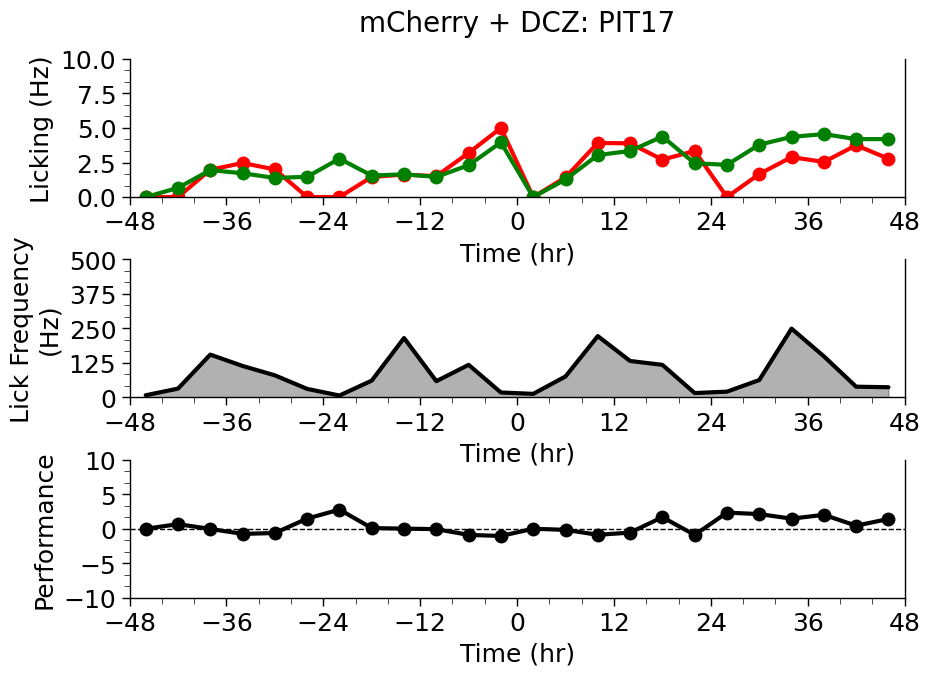

In [93]:
for c in ant_means["condition"].unique():
    if "DCZ" in c:
        click, cperf, ccount = ant_means["condition"] == c, ant_perf["condition"] == c, hourtots["condition"] == c
        ant_tmp = ant_means[click] 
        ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
        perf_tmp = ant_perf[cperf]
        perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
        ct_tmp = hourtots[ccount]
        ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
        for a in ant_tmp["animal"].unique():
            #if 'Kanye' in a:
                xmaj = ticker.MultipleLocator(12) 
                xmin = ticker.MultipleLocator(4) 
                g, axs = plt.subplots(3, 1, figsize=(10, 7))
                sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)",
                                    y="lick", hue="stimulus", palette=["red", "green"], 
                                    hue_order=["blank", "stimulus"], errorbar=None, 
                                    marker='o', mec=None, ms=10, ax=axs[0], legend=False)
                ymaj = ticker.LinearLocator(numticks=5)
                ymin = ticker.LinearLocator(numticks=13)
                style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                                    ylabel="Licking (Hz)", xlim=[-48, 48],
                                    ylim=[0, 10], xmajlocator=xmaj,xminlocator=xmin,
                                    ymajlocator=ymaj, yminlocator=ymin)
                ymaj = ticker.LinearLocator(numticks=5)
                ymin = ticker.LinearLocator(numticks=13)
                sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                                    y="trial no", color='k', errorbar=None, 
                                    ax=axs[1])
                style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                                    ylabel="Lick Frequency\n(Hz)", xlim=[-48, 48],
                                    ylim=[0, 500], xmajlocator=xmaj,xminlocator=xmin,
                                    ymajlocator=ymaj, yminlocator=ymin)
                axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                                color='k', alpha=0.3)
                sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                                    y="lick", color='k', errorbar=None, 
                                    marker='o', mec=None, ms=10, ax=axs[2])
                ymaj = ticker.LinearLocator(numticks=5)
                ymin = ticker.LinearLocator(numticks=13)
                style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                                    ylabel="Performance", xlim=[-48, 48], 
                                    ylim=[-10, 10], xmajlocator=xmaj,xminlocator=xmin,
                                    ymajlocator=ymaj, yminlocator=ymin)
                axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=1)

                
                g.subplots_adjust(hspace=0.45, wspace=0.25)
                plt.show()

Number of trials by day

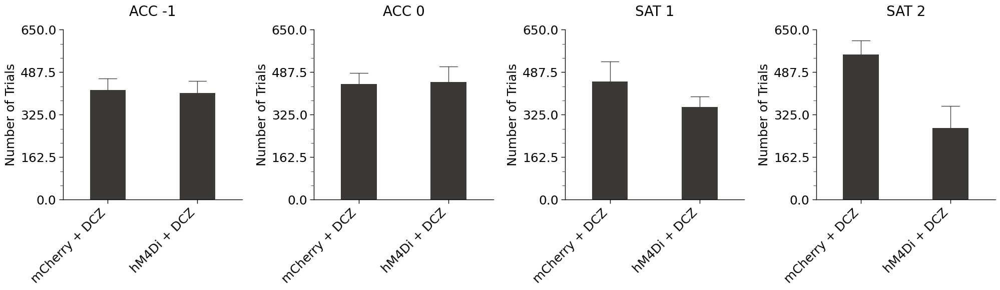

In [94]:
cond = (daytots["condition"].str.contains('DCZ'))# | (daytots["condition"] == '100% ACC, 80% SAT') | (daytots["condition"] == '100acc80acc')
cond = ((daytots["Day"] != "SAT 3") )& cond
ordr=["mCherry + DCZ", "hM4Di + DCZ"]
daytots = daytots.sort_values('Day')
g = plot_trial_bar(daytots[cond], xlim=[-0.5, 1.5], ylim=[0, 650],wspace=0.4, dodge=False, order=['mCherry + DCZ', 'hM4Di + DCZ'])
for name, ax in g.axes_dict.items():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

### 2.1.3 Statistical Tests, unfiltered

Total number of trials between groups by day (should not be significantly different)

t-test if two conditions, ANOVA otherwise

In [ ]:
res = []
cond = (total_by_day["condition"].str.contains("DCZ"))
tmp = total_by_day[cond]
tmp = tmp.sort_values("Day")
for day in tmp["Day"].unique(): 
    tt_separated = []
    for c in tmp["condition"].unique():
        tt_separated.append(tmp[(tmp["Day"] == day) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=tmp["Day"].unique())

,statistic,pvalue
ACC -1,-0.659610,0.517856
ACC 0,-0.857203,0.402456
SAT 1,-0.956168,0.354810
SAT 2,-2.750280,0.021257
SAT 3,NaN,NaN


Total number of trials between groups by hour

t-test if two conditions, ANOVA otherwise

In [ ]:
res = []
cond = (total_by_hour["condition"].str.contains("CNO"))
tmp = total_by_hour[cond]
tmp = tmp.sort_values("Time (hr)")
for t in tmp["Time (hr)"].unique(): 
    tt_separated = []
    for c in tmp["condition"].unique():
        tt_separated.append(tmp[(tmp["Time (hr)"] == t) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=tmp["Time (hr)"].unique()).to_clipboard()

Number of animals with data per timebin

In [ ]:
num_per_timebin = counts.groupby(["condition", "animal", "Time (hr)"]).first().reset_index().groupby(["condition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin.set_index(["condition", "Time (hr)"]).unstack("Time (hr)").to_clipboard()

Total number of animals per condition

In [ ]:
num_per_timebin.groupby("condition")["animal"].max().to_clipboard()

Average number of trials in a timebin by condition

In [ ]:
total_by_hour.groupby(["condition","Time (hr)"])["trial no"].mean().unstack(level="Time (hr)").to_clipboard()

Number of trials in a timebin by animal at t=0-4 hours

In [ ]:
at0 = counts[counts["Time (hr)"] == 0][["condition","animal", "stimulus","trial no"]].set_index(["condition", "animal","stimulus"]).unstack(level="stimulus").fillna(0)
at0.loc[:, ("trial no", "sum")] = at0.loc[:, ("trial no", "blank")] + at0.loc[:, ("trial no", "stimulus")]
at0.to_clipboard()#.stack(level="stimulus").unstack(level=["condition", "animal"]).to_clipboard()

Number of trials in all timebins by animal and condition

In [ ]:
counts[["condition","animal", "Time (hr)", "stimulus","trial no"]].sort_values("Time (hr)").set_index(["condition", "animal","Time (hr)", "stimulus"]).unstack(level=["Time (hr)", "stimulus"]).to_clipboard()

In [ ]:
total_by_hour[["condition","animal", "Time (hr)","trial no"]].set_index(["condition", "animal","Time (hr)"]).unstack(level=["Time (hr)"]).to_clipboard()

Last 20% aggegrate

In [ ]:
last20_lickfreq, last20_counts, last20_perf = agg(nth_part_data, min_trials, min_blank_trials, min_water_trials, ["day_delta", "type"])

### 2.1.2 Plotting, filtered

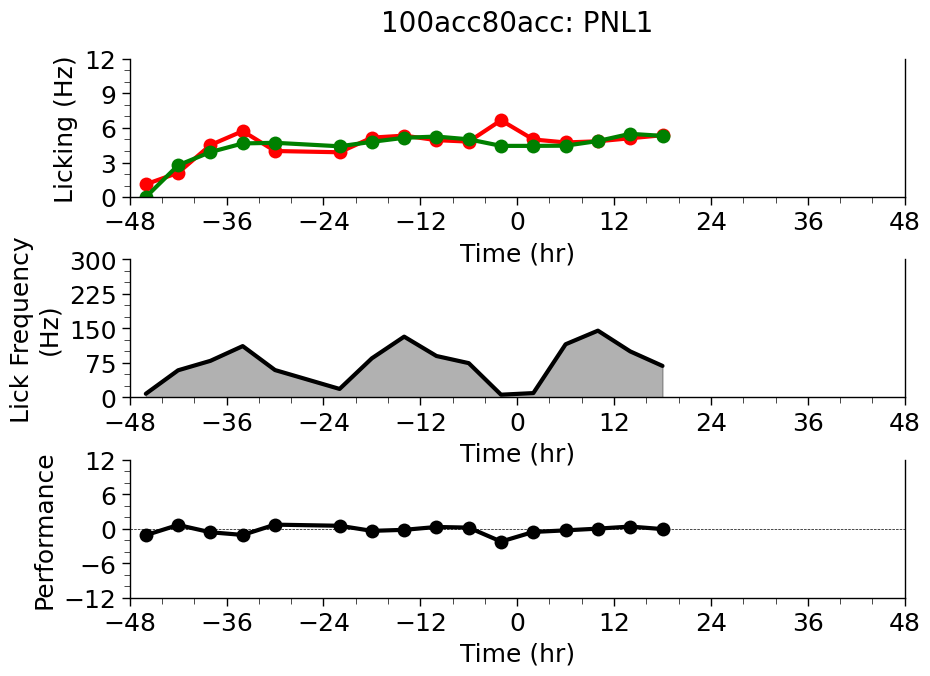

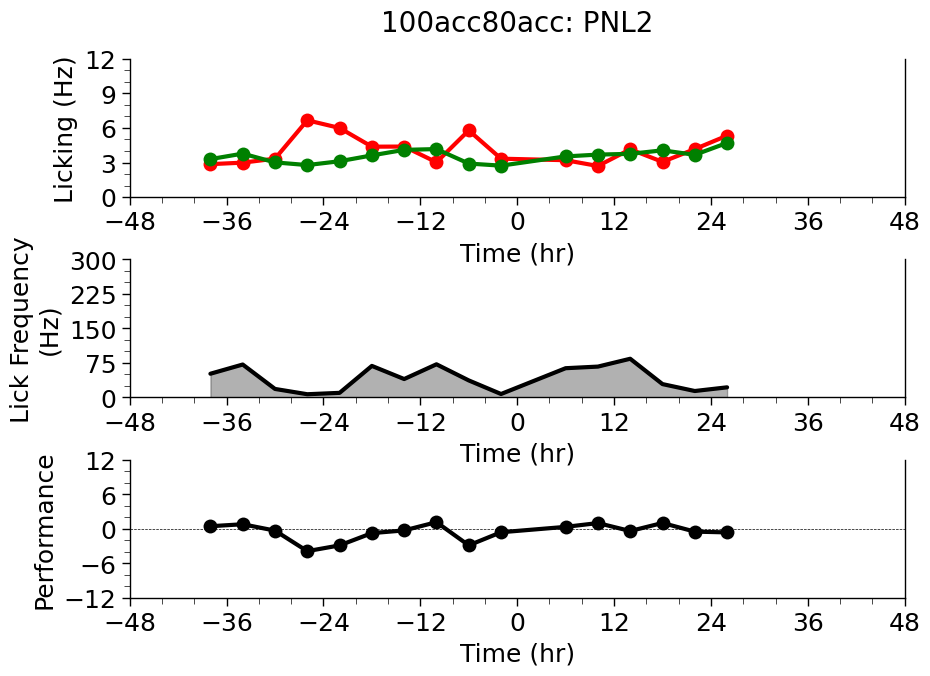

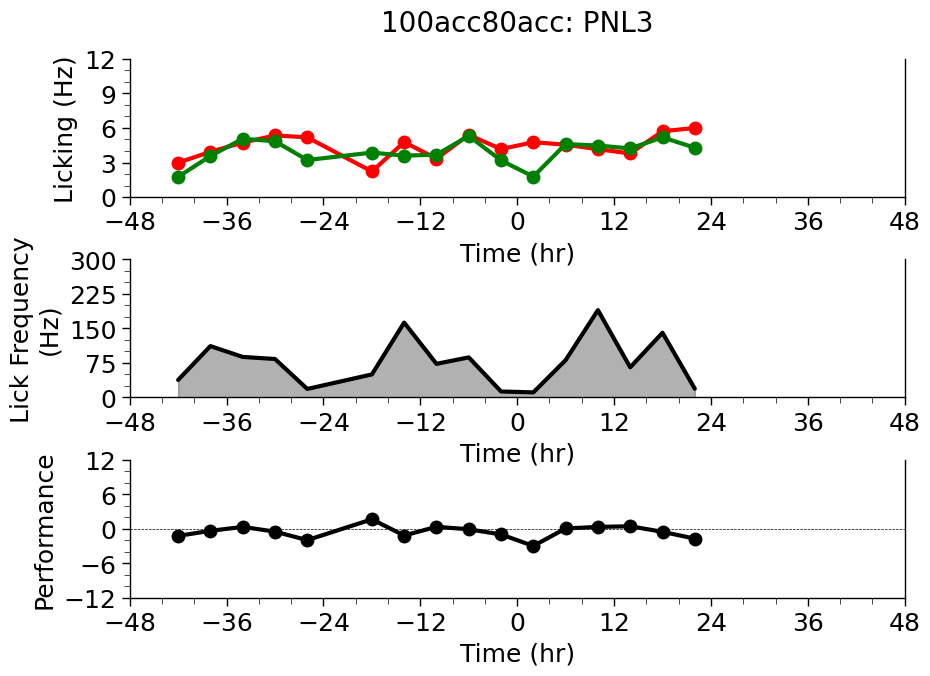

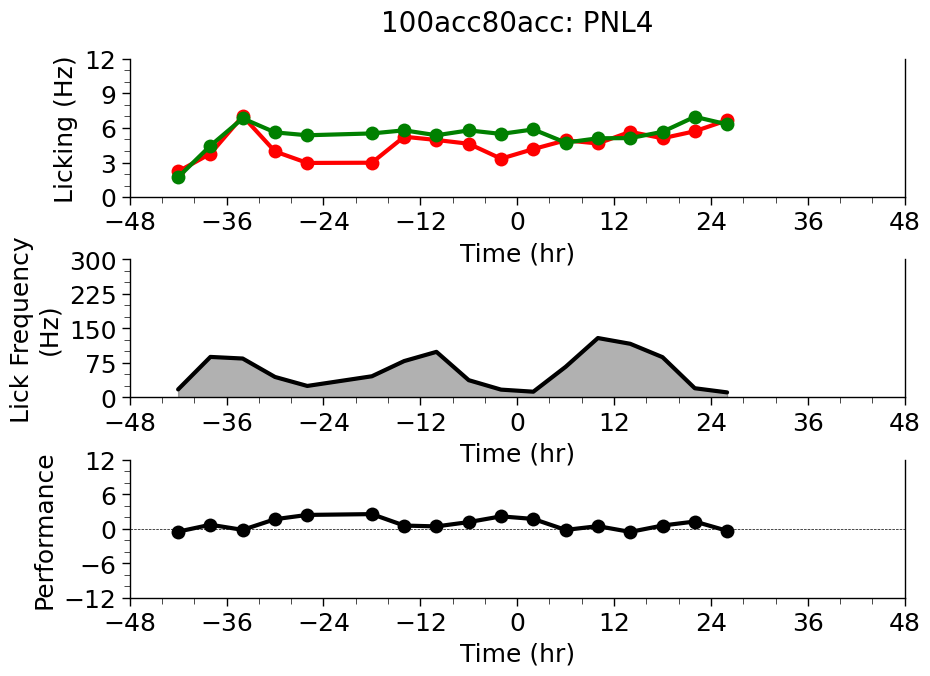

In [95]:
for c in antfiltmeans["condition"].unique():
    if c in ['100acc80acc']:
        click, cperf, ccount = antfiltmeans["condition"] == c, antfiltperf["condition"] == c, filtcounts["condition"] == c
        ant_tmp = antfiltmeans[click] 
        ant_tmp["Time (hr)"] = ant_tmp["Time (hr)"] + 2
        perf_tmp = antfiltperf[cperf]
        perf_tmp["Time (hr)"] = perf_tmp["Time (hr)"] + 2
        ct_tmp = filtcounts[ccount]
        ct_tmp["Time (hr)"] = ct_tmp["Time (hr)"] + 2
        for a in ant_tmp["animal"].unique():
            xmaj = ticker.MultipleLocator(12) 
            xmin = ticker.MultipleLocator(4) 
            g, axs = plt.subplots(3, 1, figsize=(10, 7))
            sns.lineplot(ant_tmp[ant_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", hue="stimulus", palette=["red", "green"], 
                                hue_order=["blank", "stimulus"], errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[0], legend=False)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[0], title=f"{c}: {a}", xlabel="Time (hr)", 
                                ylabel="Licking (Hz)", xlim=[-48, 48], 
                                ylim=[0, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            sns.lineplot(ct_tmp[ct_tmp["animal"] == a], x="Time (hr)", 
                                y="trial no", color='k', errorbar=None, 
                                ax=axs[1])
            style_axes_helper(axs[1], title="", xlabel="Time (hr)", 
                                ylabel="Lick Frequency\n(Hz)", xlim=[-48, 48], 
                                ylim=[0, 300], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[1].fill_between(axs[1].lines[0].get_data()[0], axs[1].lines[0].get_data()[1], 
                            color='k', alpha=0.3)
            sns.lineplot(perf_tmp[perf_tmp["animal"] == a], x="Time (hr)", 
                                y="lick", color='k', errorbar=None, 
                                marker='o', mec=None, ms=10, ax=axs[2])
            ymaj = ticker.LinearLocator(numticks=5)
            ymin = ticker.LinearLocator(numticks=13)
            style_axes_helper(axs[2], title="", xlabel="Time (hr)", 
                                ylabel="Performance", xlim=[-48, 48], 
                                ylim=[-12, 12], xmajlocator=xmaj,xminlocator=xmin,
                                ymajlocator=ymaj, yminlocator=ymin)
            axs[2].axhline(y=0, xmin=0, xmax=1, ls="--", color="black", zorder=10, lw=0.5)

            
            g.subplots_adjust(hspace=0.45, wspace=0.25)
            plt.show()

Lick frequency for stimulus and blank trials

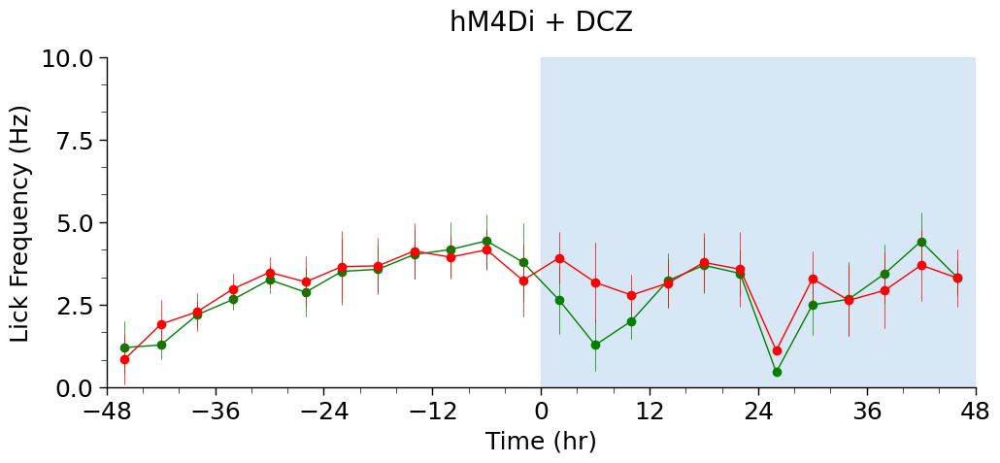

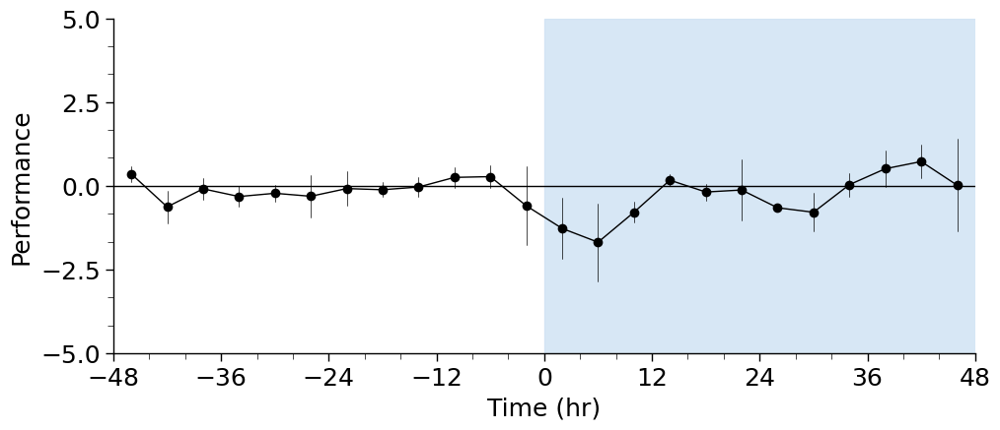

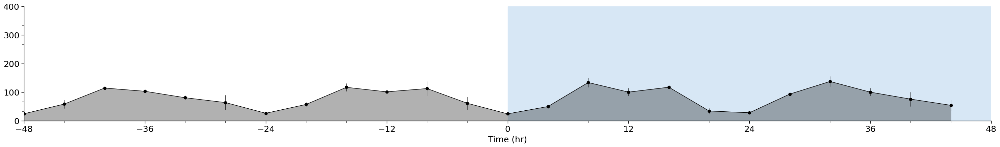

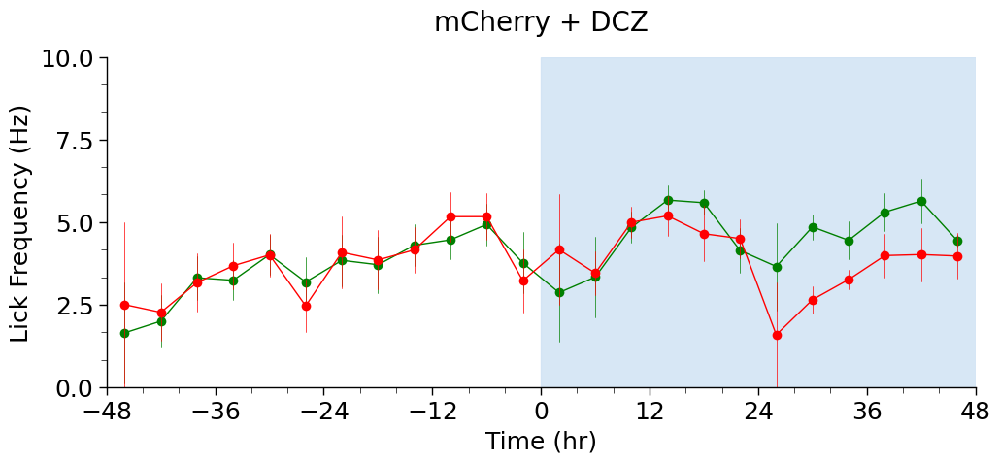

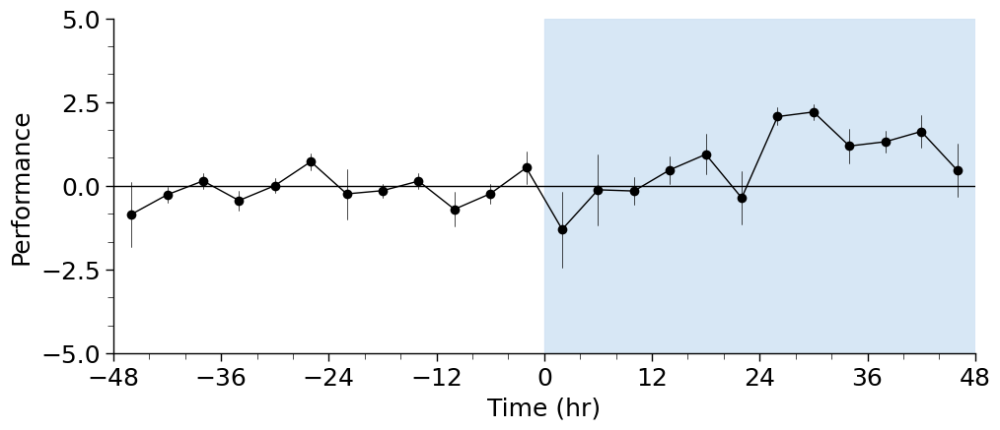

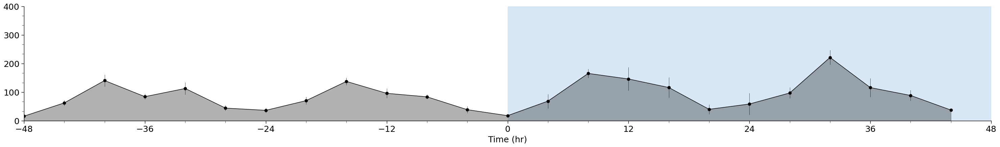

In [106]:
#antfiltmeans['Time (hr)'] = antfiltmeans['Time (hr)'] + 2
#antfiltperf['Time (hr)'] = antfiltperf['Time (hr)'] + 2
for c in antfiltmeans["condition"].unique():
    if 'DCZ' in c:
        g = plot_ant_lickfreq(antfiltmeans[(antfiltmeans["condition"] == c) & (antfiltmeans['animal'] != 'OSA8')],y='lick',aspect=2,lw=1, ms=7, title=c,
                legend=False, xlim=[-48, 48], ylim=[0, 10], errorbar='se', err_style='bars', err_kws={"lw":0.5})
        g = plot_ant_perf(antfiltperf[antfiltperf["condition"] == c], ylabel="Performance", aspect=2,lw=1, ms=7,
                        xlim=[-48,48], legend=False, ylim=[-5, 5], title='',errorbar='se', err_style='bars', err_kws={"lw":0.5})
        g = plot_trial_hr(hourtotsfilt[hourtotsfilt["condition"] == c], xlim=[-48,48], 
                          ylim=[0, 400], aspect=6, title='', ms=7, lw=1,err_kws={"lw":0.5}, ylabel='')
        #g.figure.suptitle(c, y=1.05, x=0.5, fontsize=25)


Performance (L<sub>stim</sub> - L<sub>blank</sub>) as a line plot and a bar plot

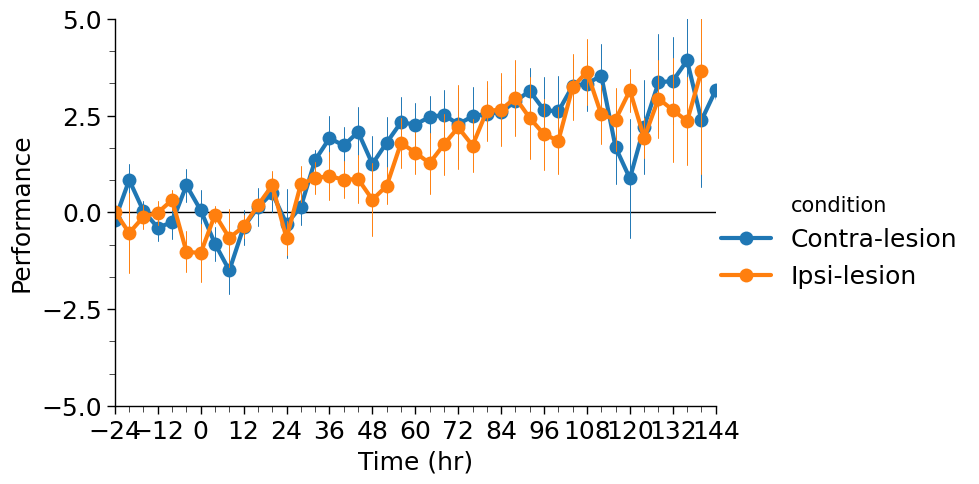

In [ ]:
#antfiltperf['Time (hr)'] = antfiltperf['Time (hr)'] + 2
sat = "#5E72FF"
dcz_hm4di = "#E1CD9B"
dcz_mcherry = "#B78787"
all_reward = "#B787B7"
#cond = (antfiltperf["condition"] == "con") | (antfiltperf["condition"] == "hM4Di + CNO")
cond = antfiltperf['condition'].str.contains('lesion')
ordr=["Control", "100% ACC, 80% SAT", "mCherry + CNO", "hM4Di + CNO","mCherry + DCZ", "hM4Di + DCZ"]
p=[sat, all_reward, "maroon","goldenrod", dcz_mcherry, dcz_hm4di]

g = plot_ant_perf(antfiltperf[cond], ylabel="Performance", xlim=[-24, 144], ylim=[-5,5],hue="condition", 
                  col=None,legend=True, errorbar='se', err_style='bars', err_kws={'lw':0.7})
g.fig.axes[0].axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=0, lw=1)

# using a palette to color different conditions

#p = [sat, all_reward, "goldenrod", "maroon", dcz_hm4di, dcz_mcherry]
#ordr=["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4Di + DCZ", "mCherry + DCZ"]
cond = (antfiltperf["condition"] == "Control") | (antfiltperf["condition"] == "hM4Di + DCZ") | (antfiltperf["condition"] == "100% ACC, 80% SAT")

ylim=[-5, 5]
#plot_ant_perf_bar(antfiltperf[cond], ylim=ylim, hue="condition", palette=p, hue_order=ordr,col_order=ordr,legend=False, xlim=[-26, 26], col_wrap=None)

Number of trials by day and by time bin

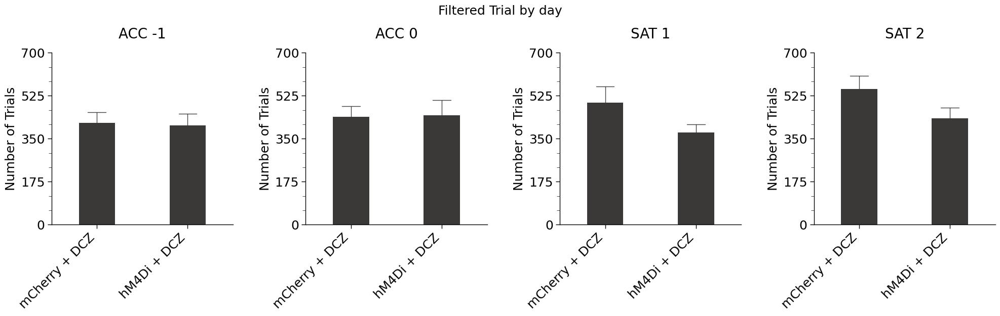

In [101]:
cond = (daytotsfilt["condition"].str.contains("DCZ"))# | (daytotsfilt["condition"] == "Control")
#total_by_day = total_by_day.sort_values("Day")
#ordr=["Control",  "mCherry + CNO", "hM4Di + CNO", "mCherry + DCZ", "hM4Di + DCZ"]
#ordr=['0.1mg DCZ mcherry', '0.1mg DCZ hm4di', '0.5mg DCZ mcherry','0.5mg-1mg DCZ hm4di']
ordr = ['mCherry + DCZ', 'hM4Di + DCZ']
cord = ["ACC -1", "ACC 0", "SAT 1","SAT 2"]
g = plot_trial_bar(daytotsfilt[cond], x='condition',xlim=[-0.5, 1.5], ylim=[0, 700],wspace=0.4, order=ordr,col_order=cord,dodge=False)
for name, ax in g.axes_dict.items():
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
g.fig.suptitle('Filtered Trial by day', y=1.05)
plt.show(g) 
#plot_trial_hr(hourtotsfilt[(hourtotsfilt["condition"].str.contains("lesion"))], xlim=[-24,120], ylim=[0, 400], aspect=4)

Last 20% of trials 

array(['100% ACC, 80% SAT', '100acc80acc', 'Contra-lesion', 'Control',
       'Ipsi-lesion', 'hM4Di + CNO', 'hM4Di + DCZ', 'mCherry + CNO',
       'mCherry + DCZ'], dtype=object)

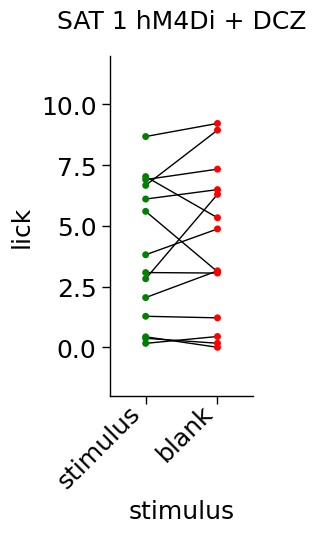

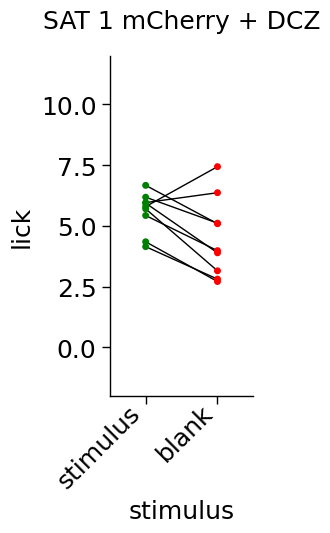

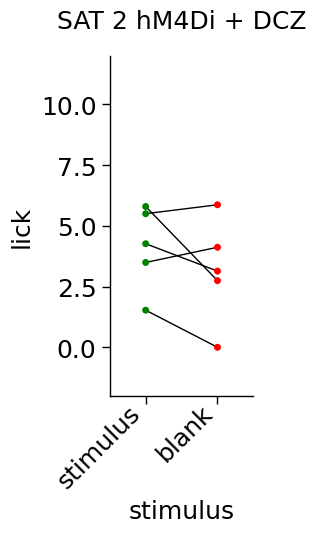

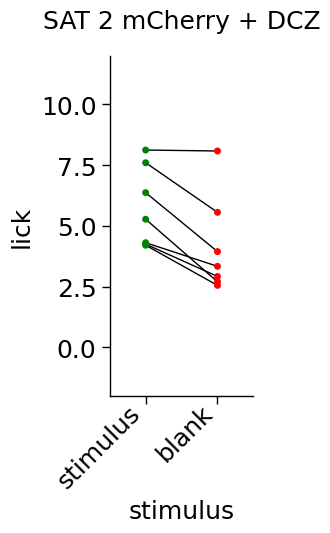

In [107]:
for day in nthpart_lickfreq["Day"].unique():
    if day in ['SAT 1', 'SAT 2']:
        x=[1, 2]
        i=0
        conds = nthpart_lickfreq["condition"].unique()
        conds.sort()
        dayfilt = nthpart_lickfreq[nthpart_lickfreq["Day"] == day]
        for c in conds:
            if'DCZ' in c:
                condfilt = dayfilt[dayfilt["condition"]==c]
                if not condfilt.empty:
                    g = sns.catplot(condfilt, y="lick",x="stimulus", order=["stimulus", "blank"],kind="strip", 
                            hue="stimulus", palette=["green", "red"], 
                            hue_order=["stimulus", "blank"],
                            col="condition", jitter=False, aspect=0.5, legend=False)
                    segs = []
                    for a in condfilt["animal"].unique():
                        anfilt = condfilt[condfilt["animal"] == a]
                        bl = anfilt[anfilt["stimulus"] == "blank"]["lick"].reset_index(drop=True)
                        st = anfilt[anfilt["stimulus"] == "stimulus"]["lick"].reset_index(drop=True)
                        if (len(bl) != 0) & (len(st) != 0):
                            add=[[0, st[0]], [1,bl[0]]]
                        segs.append(add)
                    linesegs = LineCollection(segs,color='k', lw=1)
                    g.axes_dict[c].add_collection(linesegs)
                    g.axes_dict[c].set_ylim([-2, 12])
                    g.axes_dict[c].set_title(f"{day} {c}")
                    g.axes_dict[c].tick_params(axis='x', pad=-3)
                    g.axes_dict[c].set_xticklabels(g.axes_dict[c].get_xticklabels(), rotation=45, ha="right")
                    i+=1
        #g.figure.suptitle(day, y=1.05)
conds


Number of trials by trial type

In [ ]:
# number of stimulus and blank trials as stacked plot (average but no error bars)
avg_counts = counts.groupby(["condition", "Time (hr)", "stimulus"])["trial no"].mean().reset_index()

conds = avg_counts["condition"].unique()
g, axs = plt.subplots(1, len(conds), figsize=(25,5))


ylims = [0, 300]
ymax = ylims[1]

for i in range(len(conds)):
    lab = avg_counts[avg_counts["condition"] == conds[i]]["stimulus"].unique()
    x = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[0])]["Time (hr)"]
    axs[i].spines[["top", "right"]].set_visible(False)
    y1 = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[0])]["trial no"].reset_index(drop=True)
    y2 = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[1])]["trial no"].reset_index(drop=True)
    axs[i].stackplot(x, y1, y2, labels=lab, colors=['#FFB2B2','#B2D9B2'], alpha=1, edgecolor=["green", "red"])
    axs[i].plot(x, y1, color="red")
    axs[i].scatter(x, y1, color="red", s=50)
    axs[i].plot(x, (y1 + y2),color="green")
    axs[i].scatter(x, (y1 + y2), color="green",s=50)    
    ylabel="Number of trials"
    axs[i].set_ylim(ylims)
    axs[i].xaxis.set_major_locator(ticker.MultipleLocator(12))
    axs[i].yaxis.set_major_locator(ticker.MultipleLocator(40))
    axs[i].xaxis.set_minor_locator(ticker.MultipleLocator(3))
    axs[i].yaxis.set_minor_locator(ticker.MultipleLocator(10))
    axs[i].spines[["bottom", "left"]].set(lw=2)
g.subplots_adjust(wspace=0.25)

### 2.1.3 Statistical Tests, filtered

Total number of trials between groups (should not be significantly different)

t-test if two conditions, ANOVA otherwise

In [ ]:
res = []
cond = (daytotsfilt["condition"].str.contains("100")) | (daytotsfilt["condition"] == "Control")
tmp = daytotsfilt[cond]
tmp = tmp.sort_values("Day")
for day in tmp["Day"].unique(): 
    tt_separated = []
    for c in tmp["condition"].unique():
        tt_separated.append(tmp[(tmp["Day"] == day) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=tmp["Day"].unique())

,statistic,pvalue
ACC -1,NaN,NaN
ACC 0,1.601966,0.218822
SAT 1,6.498243,0.004522
SAT 2,1.799992,0.277010


In [ ]:
res = []
cond = ((daytotsfilt["condition"].str.contains("100")) | (daytotsfilt["condition"] == "Control")) & ((daytotsfilt["Day"] == "ACC 0")| (daytotsfilt["Day"] == "SAT 1"))
tmp = daytotsfilt[cond]
tmp = tmp.sort_values("Day")
for day in tmp["Day"].unique():
    print(day) 
    tt_separated = []
    for c in tmp["condition"].unique():
        print(c)
        tt_separated.append(tmp[(tmp["Day"] == day) & (tmp["condition"] == c)]["trial no"])
    if len(tmp["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(tmp["condition"].unique()) > 2:
        res.append(stats.tukey_hsd(*tt_separated))
print('ACC 0:', res[0])
print('SAT 1:', res[1])

ACC 0
100% ACC, 80% SAT
100acc80acc
Control
SAT 1
100% ACC, 80% SAT
100acc80acc
Control
ACC 0: Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)   -207.357     0.231  -512.572    97.858
 (0 - 2)      2.357     1.000  -201.119   205.834
 (1 - 0)    207.357     0.231   -97.858   512.572
 (1 - 2)    209.714     0.223   -95.500   514.929
 (2 - 0)     -2.357     1.000  -205.834   201.119
 (2 - 1)   -209.714     0.223  -514.929    95.500

SAT 1: Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)   -258.214     0.090  -549.147    32.718
 (0 - 2)    151.119     0.141   -39.576   341.814
 (1 - 0)    258.214     0.090   -32.718   549.147
 (1 - 2)    409.333     0.004   120.564   698.103
 (2 - 0)   -151.119     0.141  -341.814    39.576
 (2 - 1)   -409.333     0.004  -698.103  -120.564



In [ ]:
res = []
ind = []
perf = perf.sort_values("Time (hr)")
for h in perf[(perf["Time (hr)"] == 0)]["Time (hr)"].unique():
    tt_separated = []
    for c in perf["condition"].unique():
        for c2 in perf["condition"].unique():
            if ((len(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"]) > 0) &
                (len(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"]) > 0)):
                res.append(stats.ttest_ind(perf[(perf["Time (hr)"] == h) & (perf["condition"] == c)]["lick"], 
                                        perf[(perf["Time (hr)"] == h) & (perf["condition"] == c2)]["lick"], equal_var=False))
                ind.append((c + " & " + c2 + " @ " + str(h)))

#ind = perf[(perf["Time (hr)"] >= -24 )& (perf["Time (hr)"] <= 24)][["Time (hr)", "condition"]].apply(tuple, axis=1).unique()

r = pd.DataFrame(res, columns=["statistic", "pvalue"], index=ind)

In [ ]:
r

,statistic,pvalue
mCherry + CNO & mCherry + CNO @ 0.0,0.000000,1.000000e+00
mCherry + CNO & hM4di + DCZ @ 0.0,2.623594,9.754810e-03
mCherry + CNO & mCherry + DCZ @ 0.0,0.762737,4.484118e-01
mCherry + CNO & Control @ 0.0,8.104625,1.880681e-14
mCherry + CNO & hM4Di + CNO @ 0.0,4.271471,2.662728e-05
"mCherry + CNO & 100% ACC, 80% SAT @ 0.0",6.011602,6.089830e-09
hM4di + DCZ & mCherry + CNO @ 0.0,-2.623594,9.754810e-03
hM4di + DCZ & hM4di + DCZ @ 0.0,0.000000,1.000000e+00
hM4di + DCZ & mCherry + DCZ @ 0.0,-0.618468,5.379513e-01
hM4di + DCZ & Control @ 0.0,3.708842,2.806852e-04


Last 20% of trials for all days of SAT

In [144]:
res = []

stimcond = nthpart_lickfreq["stimulus"] == "stimulus"
blankcond = nthpart_lickfreq["stimulus"] == "blank"

conds = nthpart_lickfreq["condition"].unique()
filt = (nthpart_lickfreq['condition'].str.contains('DCZ')) | (nthpart_lickfreq['condition'] == 'Control')
filt = filt & ((nthpart_lickfreq["Day"] == 'ACC 0') | (nthpart_lickfreq["Day"] == 'SAT 1') | (nthpart_lickfreq["Day"] == 'SAT 2'))
ind = nthpart_lickfreq[filt][["Day", "condition"]].apply(tuple, axis=1).unique()

for day, c in ind:
    daycond = nthpart_lickfreq["Day"] == day
    ccond = nthpart_lickfreq["condition"] == c
    stim = nthpart_lickfreq[stimcond & daycond & ccond]["lick"]
    blank = nthpart_lickfreq[blankcond & daycond & ccond]["lick"]
    res.append(stats.wilcoxon(stim, blank))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + x[0]))

,statistic,pvalue
"Control, SAT 1",48.0,0.807739
"Control, SAT 2",2.0,0.750000
"Control, ACC 0",39.0,0.649644
"hM4Di + DCZ, ACC 0",35.0,0.497314
"hM4Di + DCZ, SAT 1",37.0,0.357544
"hM4Di + DCZ, SAT 2",3.0,0.312500
"mCherry + DCZ, ACC 0",26.0,0.921875
"mCherry + DCZ, SAT 1",8.0,0.097656
"mCherry + DCZ, SAT 2",0.0,0.015625


## 2.1.a Anticipatory licking, up to first 10 blank trials after SAT (12pm on SAT1)

[36]
[87]
[59]
[84]
[38]
[69]
[39]
[53]
[43]
[74]
[44]
[48]
[60]
[76]
[68]
[27]
[60]
[]
[56]
[57]
[57]
[60]
[72]
[74]
[53]
[60]
[34]
[77]
[55]
[41]
[40]
[65]
[50]
[83]
[70]
[81]
[83]
[72]
[52]
[66]
[79]
[43]
[54]
[41]
[54]
[50]
[50]
[56]
[54]
[72]
[68]
[36]
[48]
[32]
[59]
[35]
[37]
[50]
[59]
[92]
[61]
[46]
[56]
[50]
[40]
[77]
[77]
[38]
[68]
[41]


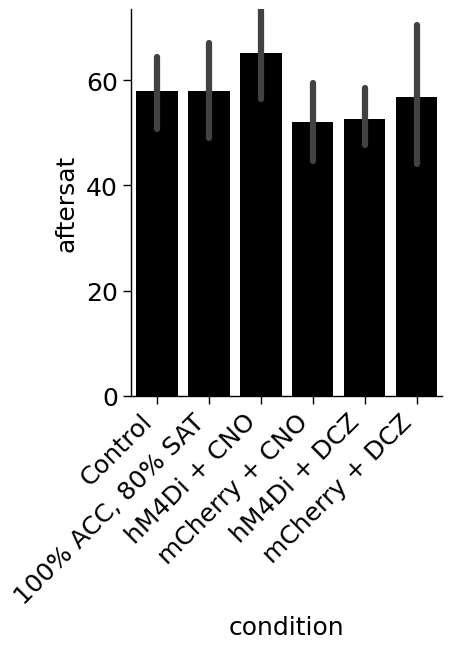

In [ ]:
tmp = ant_data[ant_data["delta"] >= pd.to_timedelta(0)]
tmp = tmp.set_index(["condition", "animal", "stimulus"])
tmp["aftersatcond"] = tmp.groupby(["condition", "animal", "stimulus"]).cumcount()
tmp = tmp.reset_index().set_index(["condition", "animal"])
tmp["aftersat"] = tmp.groupby(["condition", "animal"]).cumcount()
tmp = tmp.reset_index()
tmp2 = tmp[(tmp["stimulus"] == "blank") & (tmp["aftersatcond"] == 10)][["condition", "animal","aftersat"]]
o = ["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4Di + DCZ", "mCherry + DCZ"]
g = sns.catplot(tmp2, kind="bar", color='k', x='condition', y='aftersat', order=o)
g.figure.axes[0].set_xticklabels(g.figure.axes[0].get_xticklabels(), rotation=45, ha='right')

def s (x):
    numtrials = x[(x["stimulus"] == "blank") & (x["aftersatcond"] == 10)]["aftersat"].values
    print(numtrials)
    if len(numtrials) > 0:
        return x[x["aftersat"] < numtrials[0]]
    else:
        return pd.DataFrame()

first10blank = tmp.groupby(["condition", "animal"]).apply(lambda x: s(x)).reset_index(drop=True)

[Text(0, 0, 'Control'),
 Text(1, 0, '100% ACC, 80% SAT'),
 Text(2, 0, 'hM4Di + CNO'),
 Text(3, 0, 'mCherry + CNO'),
 Text(4, 0, 'hM4Di + DCZ'),
 Text(5, 0, 'mCherry + DCZ')]

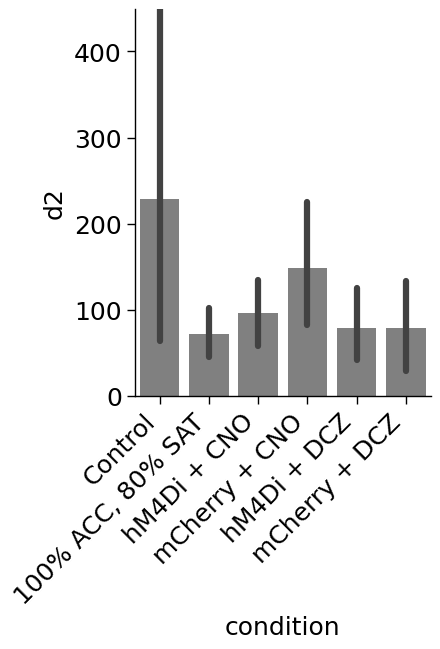

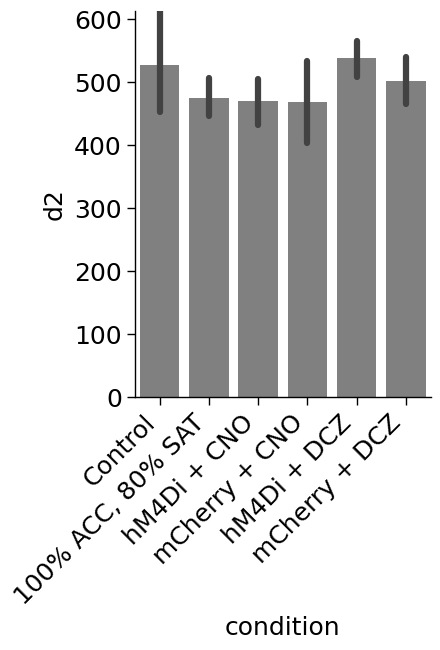

In [ ]:
first10blank['d'] = first10blank["timestamp"] - first10blank["trial start"]
first10blank = time_to_float(first10blank, 'd2', 'd', 'm') 
ts = first10blank.groupby(["condition","animal"]).first().reset_index()
te = first10blank.groupby(["condition","animal"]).last().reset_index()
g = sns.catplot(ts, x="condition", y="d2",color='grey', kind='bar', order=o)
g.figure.axes[0].set_xticklabels(g.figure.axes[0].get_xticklabels(), rotation=45, ha='right')
g = sns.catplot(te, x="condition", y="d2",color='grey', kind='bar', order=o)
g.figure.axes[0].set_xticklabels(g.figure.axes[0].get_xticklabels(), rotation=45, ha='right')

In [ ]:
# on average 18% blank trials, 30 trials to 10 blank trials, 2h to first trial, 14h at last trial - ~60 trials across 3 timebins
[(10 / first10blank["aftersat"]).mean(), first10blank["aftersat"].mean(), str(first10blank.groupby(["condition","animal"]).first()["d"].mean()),
str(first10blank.groupby(["condition","animal"]).last()["d"].mean())]

[inf,
 30.166497719209325,
 '0 days 02:05:34.552608701',
 '0 days 08:14:58.519275371']

In [ ]:
# number of trials to 10 blank trials is ns across groups
res = []
tt_separated = []
for c in tmp2["condition"].unique(): 
    tt_separated.append(tmp2[tmp2["condition"] == c]["aftersat"])
stats.f_oneway(*tt_separated)

F_onewayResult(statistic=1.113269326473015, pvalue=0.36246437721227237)

In [ ]:
# time to first trial is ns across groups
res = []
tt_separated = []
i = 0
for c in tmp["condition"].unique(): 
    #print(f'{i} : {c}')
    i += 1
    tt_separated.append(ts[ts["condition"] == c]["d2"])
print(f'time to start: {stats.f_oneway(*tt_separated)}\n')

# time to last trial is ns across groups
res = []
tt_separated = []
i = 0
for c in tmp["condition"].unique(): 
    #print(f'{i} : {c}')
    i += 1
    tt_separated.append(te[te["condition"] == c]["d2"])
print(f'time to end: {stats.f_oneway(*tt_separated)}\n')

time to start: F_onewayResult(statistic=1.055944452306524, pvalue=0.39310171591990295)

time to end: F_onewayResult(statistic=0.8099158037104417, pvalue=0.5469190529978136)



F_onewayResult(statistic=0.8522959833438348, pvalue=0.518154568223256)

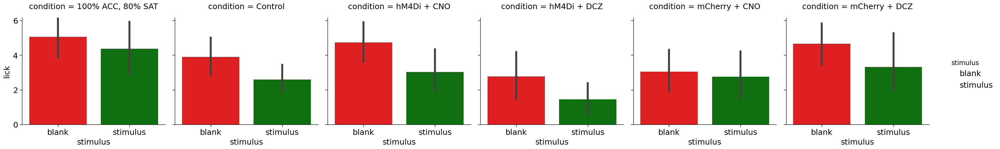

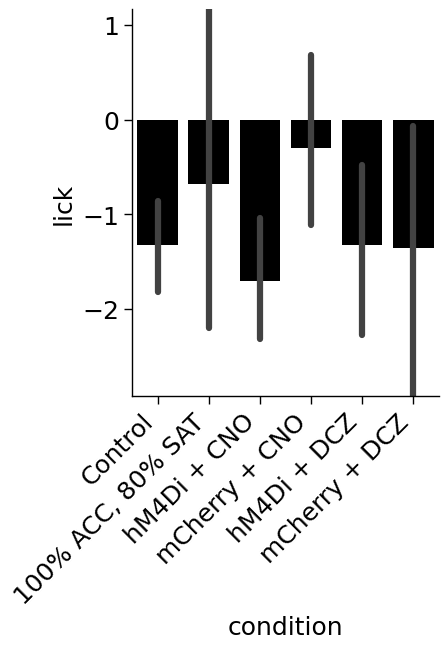

In [ ]:
lf = first10blank.groupby(["condition", "animal", "stimulus"])[["lick", "poke"]].mean().reset_index()
perf = lf.groupby(["condition", "animal"]).apply(lambda x: x[x["stimulus"] == "stimulus"]["lick"].reset_index() - x[x["stimulus"] == "blank"]["lick"].reset_index()).reset_index()
sns.catplot(lf, kind="bar", x="stimulus", y="lick",  col="condition", hue="stimulus", palette=["red", "green"], hue_order=["blank", "stimulus"])
o = ["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4Di + DCZ", "mCherry + DCZ"]
g = sns.catplot(perf, kind="bar", x="condition", y="lick", color='k', order=o)
g.figure.axes[0].set_xticklabels(g.figure.axes[0].get_xticklabels(), rotation=45, ha='right')


res = []
tt_separated = []
for c in perf["condition"].unique(): 
    s = perf[(perf["condition"] == c) & (perf["stimulus"] == "stimulus")]["lick"]
    b = perf[(perf["condition"] == c) & (perf["stimulus"] == "blank")]["lick"]
    res.append(stats.ttest_ind(s, b, equal_var=False))

pd.DataFrame(res, columns=["statistic", "pvalue"], )


In [ ]:
# performance for first ~50 trials is ns across groups
res = []
tt_separated = []
for c in perf["condition"].unique(): 
    tt_separated.append(perf[perf["condition"] == c]["lick"])
stats.f_oneway(*tt_separated)


## 2.1.b Anticipatory licking, 1h bins



### 2.1.1 Analysis

The range `r` is inclusive on both sides.

In [72]:
time_bin = 1*60

In [73]:
r = (700, 1000)
ant_data = bin_lickfreq_analysis(df, r, time_bin)

NameError: name 'bin_lickfreq_analysis' is not defined

In [ ]:
ant_mean_statistics, counts, ant_perf = bin_aggregate_analysis(ant_data, min_trials, min_blank_trials, min_water_trials, ["Day", "day_delta", "type"])

total_by_day = sum_trials(counts, ["condition", "animal", "Day"], "trial no")
total_by_hour = sum_trials(counts, ["condition", "animal", "Time (hr)"], "trial no")

In [ ]:
parts = 5 # number of partitions to divide each day's trials into 
nth_part = 4 # which partition of trials to get (0-indexed)

nth_part_data = get_nth_part_day(ant_data, parts, nth_part)

# TODO: get aggregate analysis to work with last 20% (only aggregates by 4hr bins)
last20_lickfreq, last20_counts, last20_perf = bin_aggregate_analysis(nth_part_data, min_trials, min_blank_trials, min_water_trials, ["day_delta", "type"])

### 2.1.2 Animal N's

Number of animals with data per timebin

In [ ]:
cts = counts[(counts["Time (hr)"] < 6) & (counts["Time (hr)"] >= -8)]
num_per_timebin = counts.groupby(["condiition", "animal", "Time (hr)"]).first().reset_index().groupby(["condiition","Time (hr)"])["animal"].count().reset_index()
num_per_timebin.set_index(["condiition", "Time (hr)"]).unstack("Time (hr)")


animal                                                        ...  \
Time (hr)  -48.0 -47.0 -46.0 -45.0 -44.0 -43.0 -42.0 -41.0 -40.0 -39.0  ...   
depress                                                                 ...   
hm4di        1.0   1.0   NaN   NaN   NaN   2.0   2.0   5.0   5.0   4.0  ...   
mcherry      1.0   3.0   2.0   1.0   3.0   2.0   3.0   5.0   7.0   6.0  ...   

                                                                       
Time (hr)  30.0  31.0  32.0  33.0  35.0  36.0  38.0  39.0  40.0  41.0  
depress                                                                
hm4di       NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN   NaN  
mcherry     1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0   1.0  

[2 rows x 86 columns]

Total number of animals per condition

### 2.1.3 Plotting

Lick frequency for stimulus and blank trials

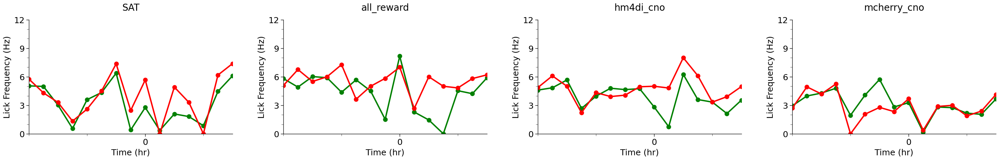

In [ ]:
#plot_ant_lickfreq(ant_mean_statistics, legend=False, ylim=[0,8], xlim=[-8, 8])
plot_ant_lickfreq(ant_mean_statistics, legend=False, col="condition", ylim=[0,12], xlim=[-8, 6])

Performance (L<sub>stim</sub> - L<sub>blank</sub>) as a line plot and a bar plot

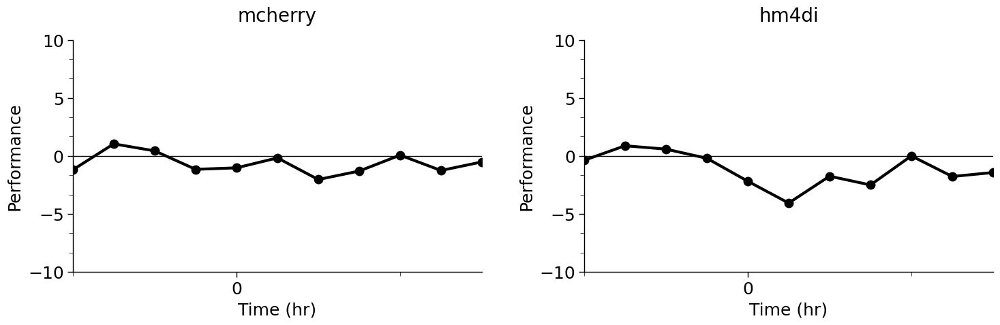

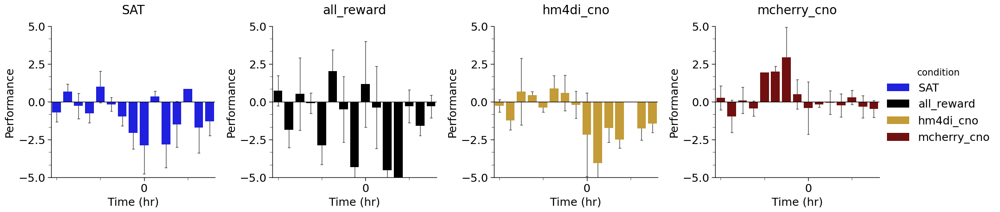

In [ ]:
#plot_ant_perf(ant_perf, ylabel="Performance", xlim=[-48, 48])
plot_ant_perf(ant_perf, ylabel="Performance", xlim=[-4, 6], col="depress")

# using a palette to color different conditions
p = ['b', 'k', "goldenrod", "maroon"]
ordr = ["SAT", 'all_reward',"hm4di_cno", "mcherry_cno"]
ylim=[-5, 5]
plot_ant_perf_bar(ant_perf, ylim=ylim, hue="condition", palette=p, xlim=[-8.5,6.5], 
                  col="condition", hue_order=ordr)

Number of trials by time bin

In [ ]:
th = total_by_hour[(total_by_hour["Time (hr)"] < 6) & (total_by_hour["Time (hr)"] >= -8)]
th.groupby(["depress", "Time (hr)"])["trial no"].mean().unstack(level="Time (hr)")

Time (hr),-8.0,-7.0,-6.0,-5.0,-4.0,-3.0,-2.0,-1.0,0.0,1.0,2.0,3.0,4.0,5.0
depress,,,,,,,,,,,,,,
hm4di,44.750000,24.750000,19.333333,18.000000,16.666667,30.75,20.625,20.833333,12.000000,14.333333,20.500000,18.500,13.000000,17.400000
mcherry,30.548387,28.458333,29.100000,20.307692,21.916667,21.95,20.000,24.500000,16.181818,13.300000,20.909091,26.625,28.692308,37.428571


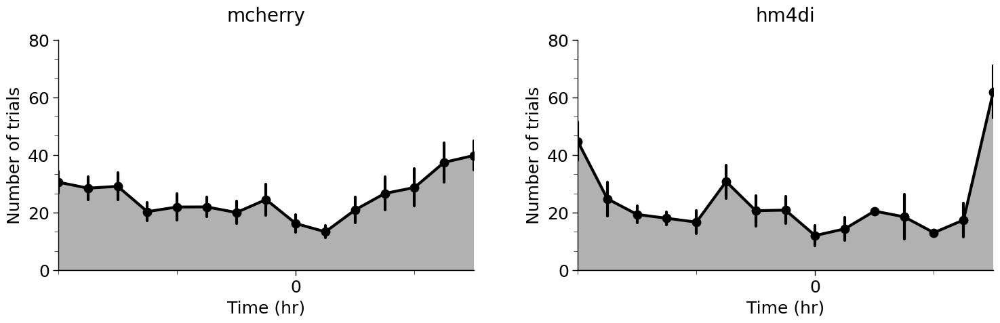

In [ ]:
plot_trial_hr(total_by_hour, xlim=[-8, 6], col="depress", ylim=[0, 80])

Last 20% of trials 

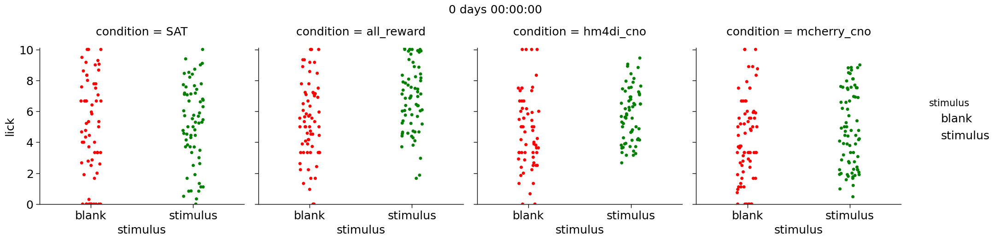

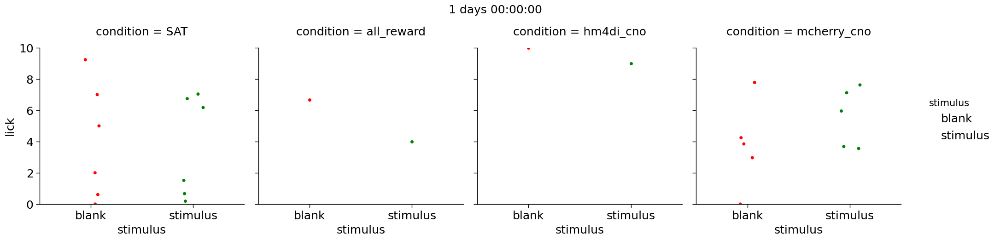

In [ ]:
# TODO: incorrect because of incorrect aggregation
for day in last20_lickfreq["day_delta"].unique():
    if day >= pd.to_timedelta(0):
        g = sns.catplot(last20_lickfreq[last20_lickfreq["day_delta"] == day], 
                    y="lick",x="stimulus", kind="strip", hue="stimulus", 
                    palette=["red", "green"], hue_order=["blank", "stimulus"],
                    col="condition")
        g.figure.suptitle(day, y=1.05)

Number of trials by trial type

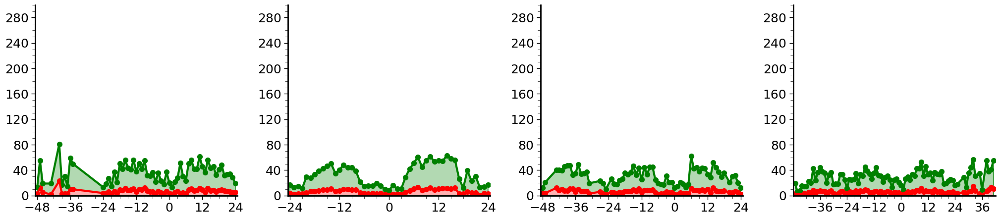

In [ ]:
# number of stimulus and blank trials as stacked plot (average but no error bars)
avg_counts = counts.groupby(["condition", "Time (hr)", "stimulus"])["trial no"].mean().reset_index()

conds = avg_counts["condition"].unique()
g, axs = plt.subplots(1, len(conds), figsize=(25,5))


ylims = [0, 300]
ymax = ylims[1]

for i in range(len(conds)):
    lab = avg_counts[avg_counts["condition"] == conds[i]]["stimulus"].unique()
    x = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[0])]["Time (hr)"]
    axs[i].spines[["top", "right"]].set_visible(False)
    y1 = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[0])]["trial no"].reset_index(drop=True)
    y2 = avg_counts[(avg_counts["condition"] == conds[i]) & (avg_counts["stimulus"] == lab[1])]["trial no"].reset_index(drop=True)
    axs[i].stackplot(x, y1, y2, labels=lab, colors=['#FFB2B2','#B2D9B2'], alpha=1, edgecolor=["green", "red"])
    axs[i].plot(x, y1, color="red")
    axs[i].scatter(x, y1, color="red", s=50)
    axs[i].plot(x, (y1 + y2),color="green")
    axs[i].scatter(x, (y1 + y2), color="green",s=50)    
    ylabel="Number of trials"
    axs[i].set_ylim(ylims)
    axs[i].xaxis.set_major_locator(ticker.MultipleLocator(12))
    axs[i].yaxis.set_major_locator(ticker.MultipleLocator(40))
    axs[i].xaxis.set_minor_locator(ticker.MultipleLocator(3))
    axs[i].yaxis.set_minor_locator(ticker.MultipleLocator(10))
    axs[i].spines[["bottom", "left"]].set(lw=2)
g.subplots_adjust(wspace=0.25)

### 2.1.4 Statistical Tests

Total number of trials between groups (should not be significantly different)

t-test if two conditions, ANOVA otherwise

In [ ]:
res = []
for day in total_by_day["Day"].unique(): 
    tt_separated = []
    for c in total_by_day["condition"].unique():
        tt_separated.append(total_by_day[(total_by_day["Day"] == day) & (total_by_day["condition"] == c)]["trial no"])
    if len(total_by_day["condition"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(total_by_day["condition"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
pd.DataFrame(res, columns=["statistic", "pvalue"], index=total_by_day["Day"].unique())

,statistic,pvalue
ACC 1,NaN,NaN
SAT 1,3.102755,0.034609
SAT 2,0.602556,0.631403
ACC 2,0.522120,0.669046


Total number of trials across days (should not be significantly different)

t-test if only 2 days, ANOVA otherwise

In [ ]:
res = []
for c in total_by_day["condition"].unique(): 
    tt_separated = []
    tmp = total_by_day[total_by_day["condition"] == c]
    for day in tmp["Day"].unique():
        tt_separated.append(total_by_day[(total_by_day["Day"] == day) & (total_by_day["condition"] == c)]["trial no"])
    if len(total_by_day["Day"].unique()) == 2:
        res.append(stats.ttest_ind(*tt_separated, equal_var=False))
    elif len(total_by_day["Day"].unique()) > 2:
        res.append(stats.f_oneway(*tt_separated))
        
pd.DataFrame(res, columns=["statistic", "pvalue"], index=total_by_day["condition"].unique())

,statistic,pvalue
SAT,2.282653,0.099287
all_reward,4.754305,0.017024
hm4di_cno,15.911703,0.000004
mcherry_cno,10.185315,0.000058


Last 20% of trials for all days of SAT

In [ ]:
# TODO: incorrect because of incorrect aggregation
res = []

stimcond = last20_lickfreq["stimulus"] == "stimulus"
blankcond = last20_lickfreq["stimulus"] == "blank"

days = last20_lickfreq["day_delta"].unique()
days = days[days >= pd.to_timedelta(0)]

conds = last20_lickfreq["condition"].unique()

ind = last20_lickfreq[last20_lickfreq["day_delta"] >= pd.to_timedelta(0)][["day_delta", "condition"]].apply(tuple, axis=1).unique()

for day, c in ind:
    daycond = last20_lickfreq["day_delta"] == day
    ccond = last20_lickfreq["condition"] == c
    stim = last20_lickfreq[stimcond & daycond & ccond]["lick"]
    blank = last20_lickfreq[blankcond & daycond & ccond]["lick"]
    res.append(stats.ttest_ind(stim, blank, equal_var=False))

pd.DataFrame(res, columns=["statistic", "pvalue"], index=pd.Series(ind).apply(lambda x: x[1] + ", " + str(x[0])))

,statistic,pvalue
"SAT, 0 days 00:00:00",0.738592,0.461587
"SAT, 1 days 00:00:00",-0.125714,0.902492
"all_reward, 0 days 00:00:00",3.804364,0.000218
"all_reward, 1 days 00:00:00",NaN,NaN
"hm4di_cno, 0 days 00:00:00",2.761020,0.006763
"hm4di_cno, 1 days 00:00:00",NaN,NaN
"mcherry_cno, 0 days 00:00:00",1.322064,0.188289
"mcherry_cno, 1 days 00:00:00",1.205695,0.266864


## 2.2 Lick frequency for entire trial


If `freq_window` is not `None` data will be averaged with a rolling window of the
given length. Data will then be averaged into discrete time bins the legnth of
`freq_bin`. If `freq_bin` is the rate at which data is sampled (every 100ms),
then instentaneous lick frequency will be averaged across animals. 

Parameters

In [108]:
freq_window = None # milliseconds, length of rolling window
freq_bin = 100 # milliseconds, length of discrete time bin
time_bin = 4*60

### 2.2.1 Analysis

In [109]:
keys["millis bin"] = "puff delta"
time_bin = 4*60 # minutes

data = full_lickfreq(df, freq_window, freq_bin, time_bin, keys, keep, values)

flkeep = keep + ["Time (hr)", "delta", "Day", "day_delta", "puff delta", "Time (ms)"]

keys["time bin"] = "delta"
means, flcounts, perf = agg(data, keys, index, flkeep, values)
daytots = sum_trials(flcounts, index + ["Day"],[], "trial no")
hourtots = sum_trials(flcounts, index + ["Time (hr)"],[], "trial no")

mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials

data_filtered = drop_group(data, mins, keys, "trial no", index, flkeep)
filtmeans, flfiltcounts, filtperf = agg(data_filtered, keys, index, flkeep, values)
daytotsfilt = sum_trials(flfiltcounts, index + ["Day"],[], "trial no")
hourtotsfilt = sum_trials(flfiltcounts, index + ["Time (hr)"], [],"trial no")

animal
210219_JQZ_3M_Kendall        2021-02-19 12:00:00
210219_JQZ_4M_Khloe          2021-02-19 12:00:00
210219_JQZ_5M_Kanye (ispi)   2021-02-19 12:00:00
210306_JQZ1F_Kanye           2021-03-06 12:00:00
210406_JUR_1F_Kylie          2021-04-06 12:00:00
                                     ...        
PIU9                         2024-01-06 12:00:00
PNL1                         2024-01-24 12:00:00
PNL2                         2024-01-24 12:00:00
PNL3                         2024-01-27 12:00:00
PNL4                         2024-01-27 12:00:00
Name: trial start, Length: 105, dtype: datetime64[ns]
animal
210219_JQZ_3M_Kendall        2021-02-19 12:00:00
210219_JQZ_4M_Khloe          2021-02-19 12:00:00
210219_JQZ_5M_Kanye (ispi)   2021-02-19 12:00:00
210306_JQZ1F_Kanye           2021-03-06 12:00:00
210406_JUR_1F_Kylie          2021-04-06 12:00:00
                                     ...        
PIU9                         2024-01-06 12:00:00
PNL1                         2024-01-24 12:00:00
P

### 2.2.2 Plotting

Instentaneous licking frequency for stimulus and blank trials for entire trial

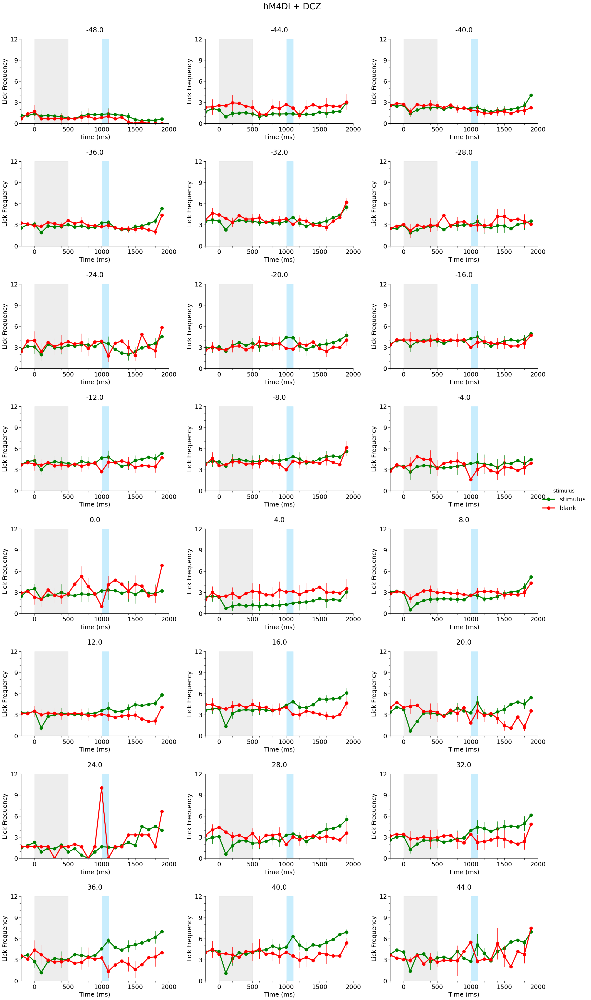

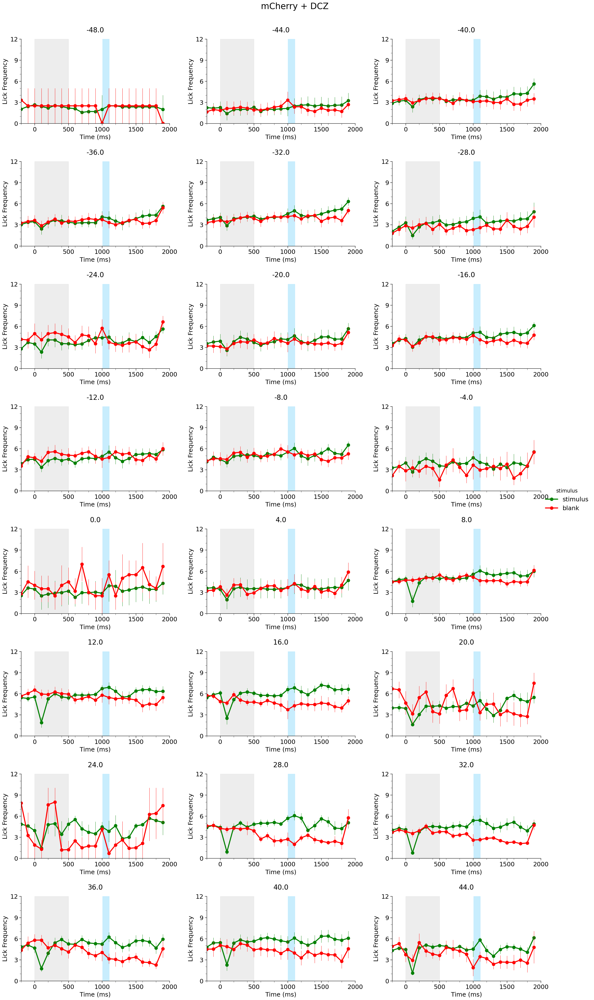

In [111]:
for c in filtmeans['condition'].unique():
    if 'DCZ' in c:
        plot_lickfreq(filtmeans[filtmeans['condition'] == c], suptitle=c,
                    col_wrap=3,errorbar='se', err_style='bars', err_kws={'lw':0.7})

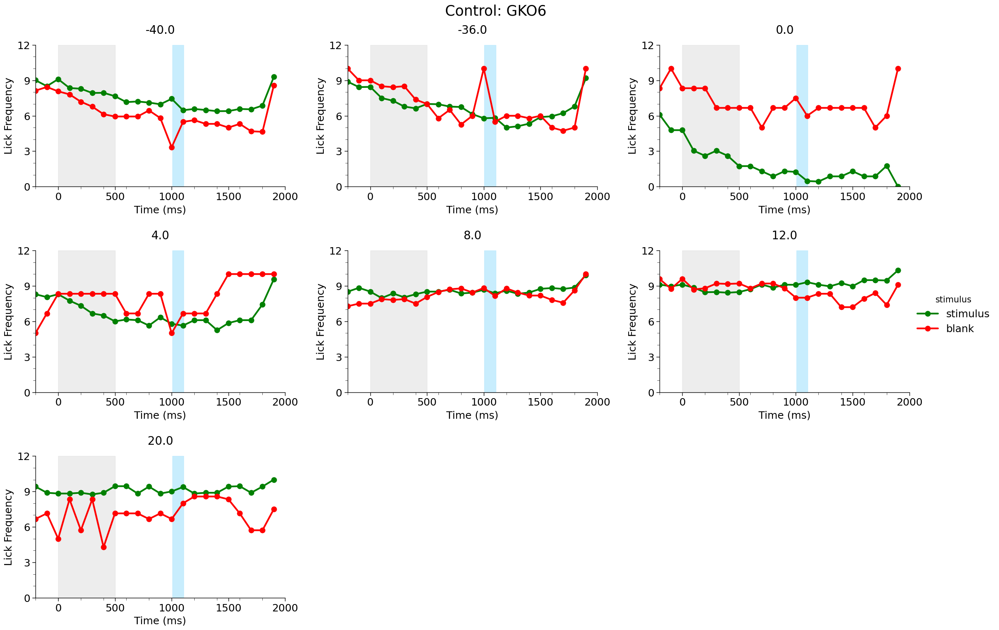

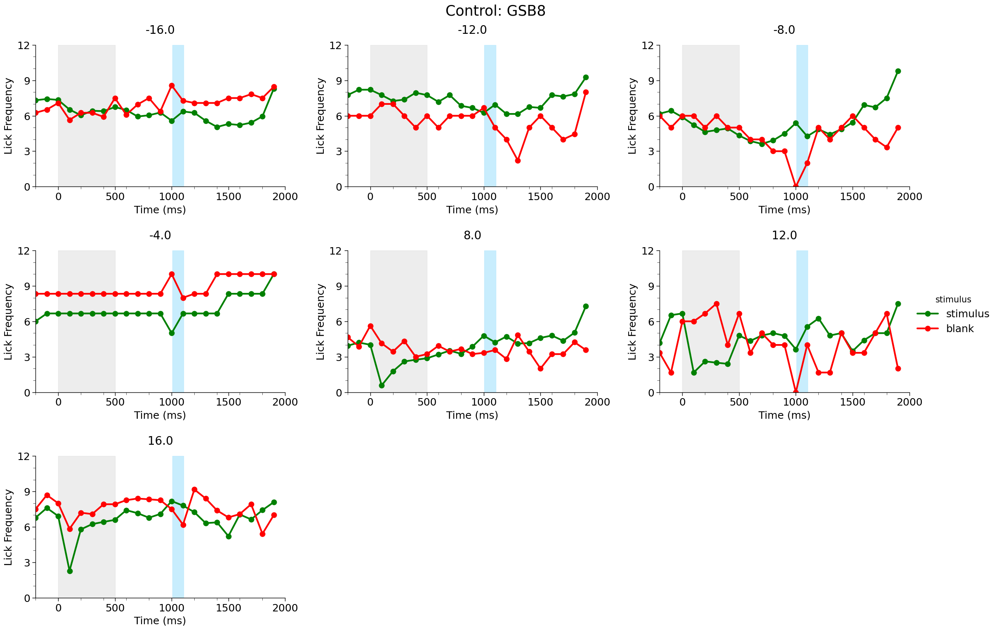

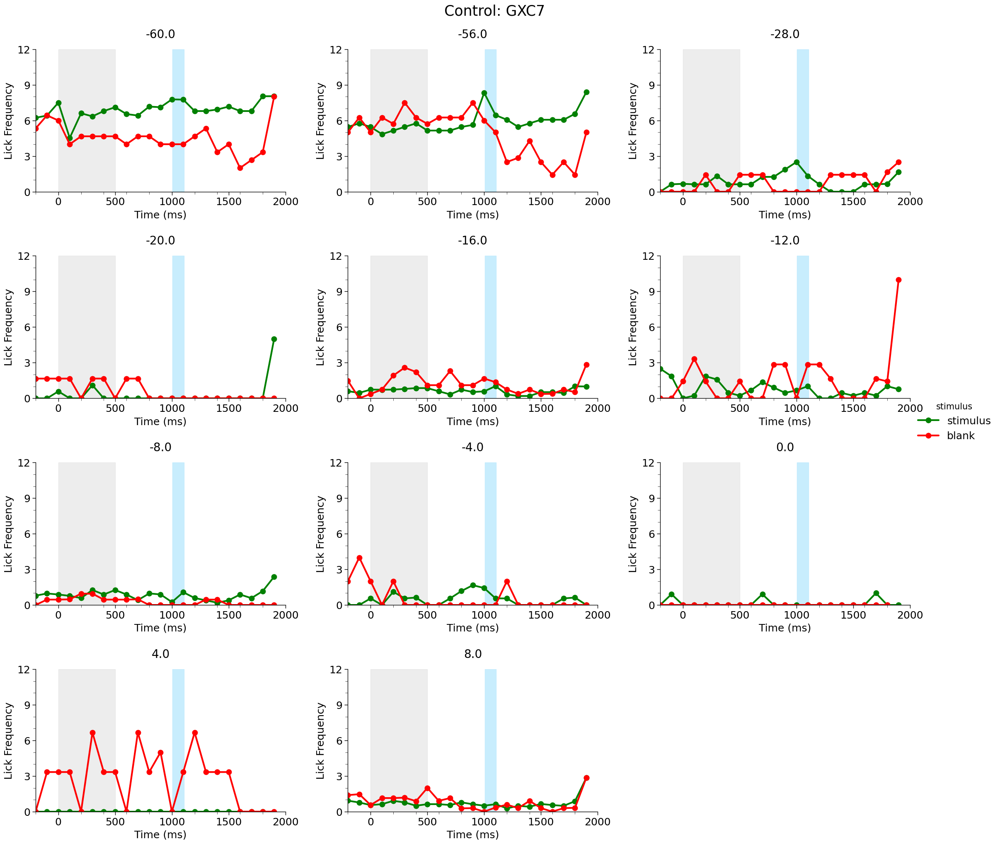

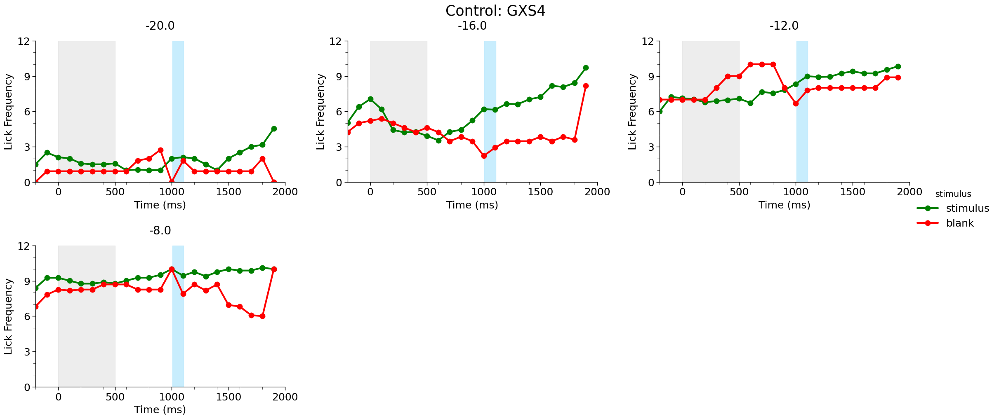

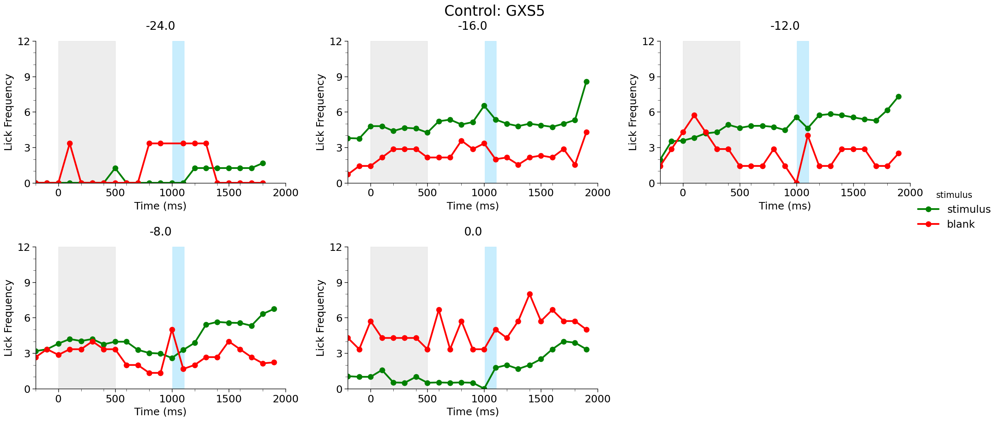

...

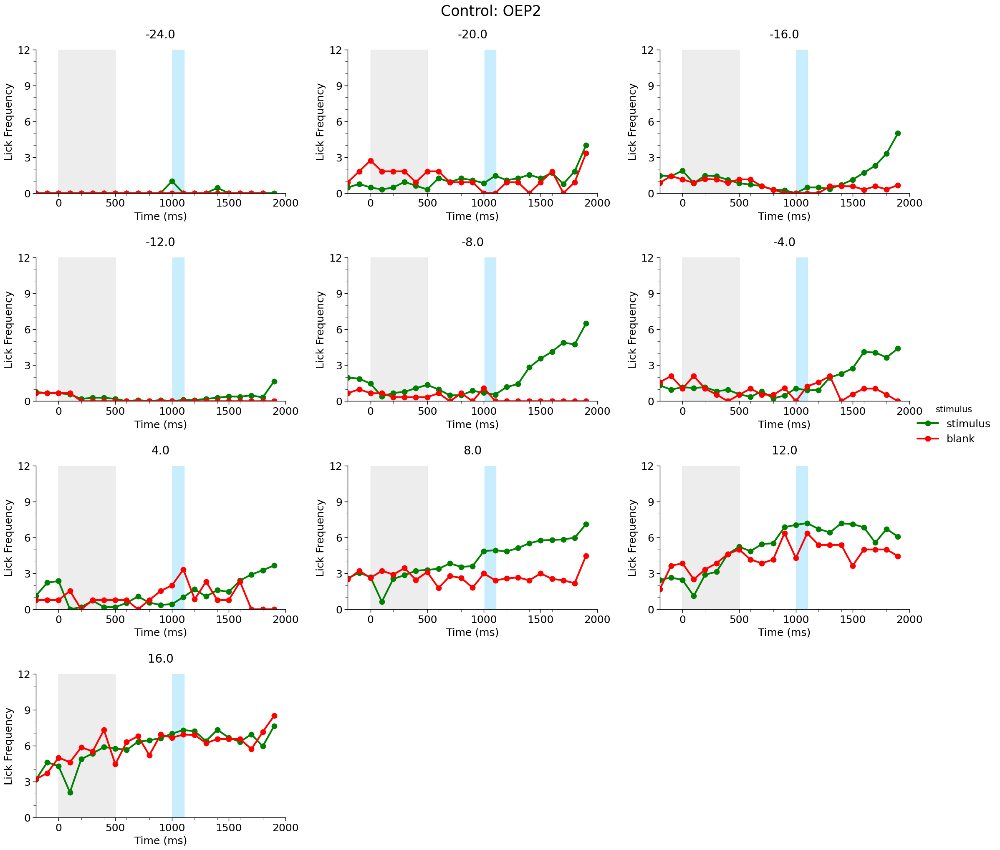

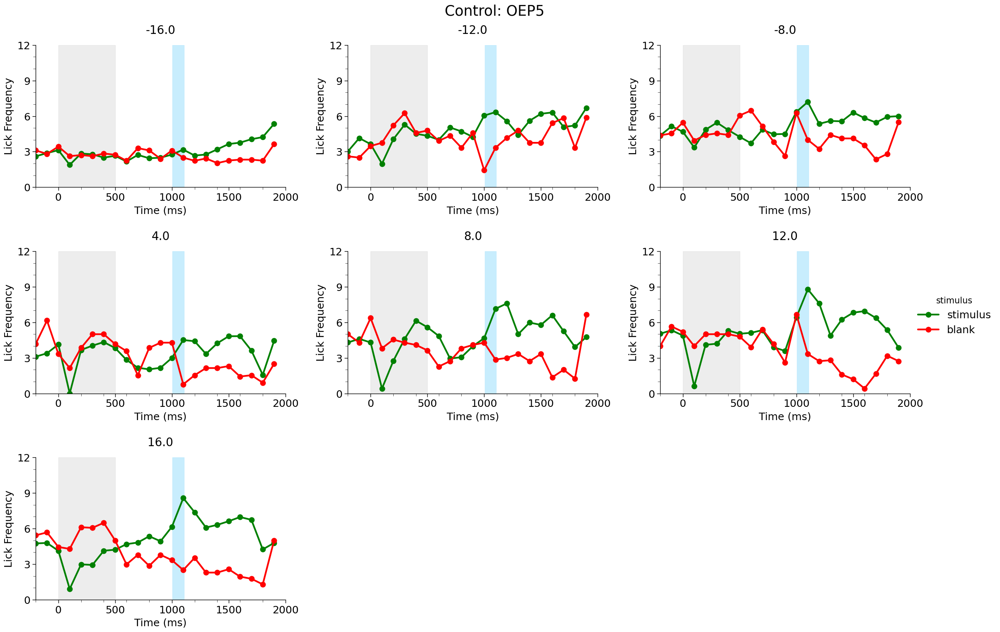

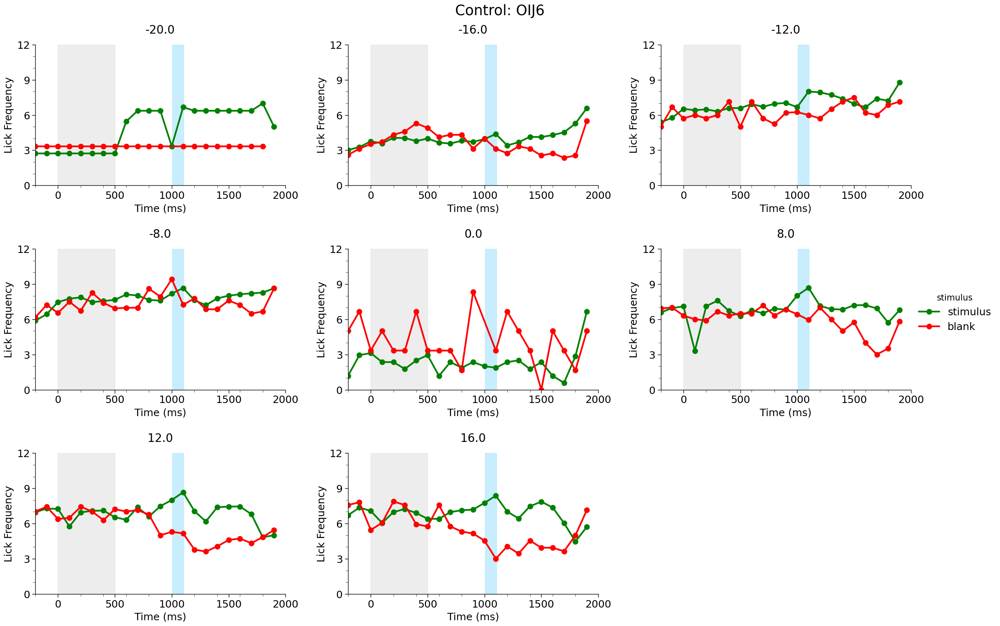

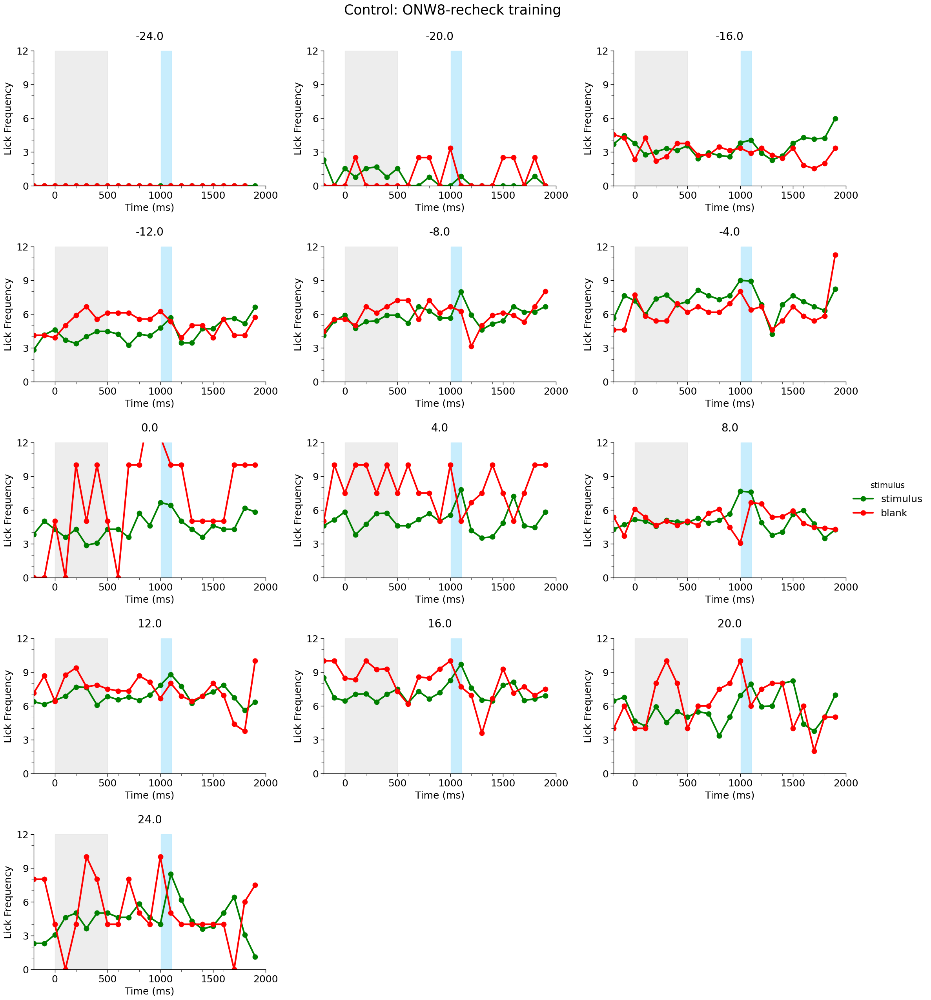

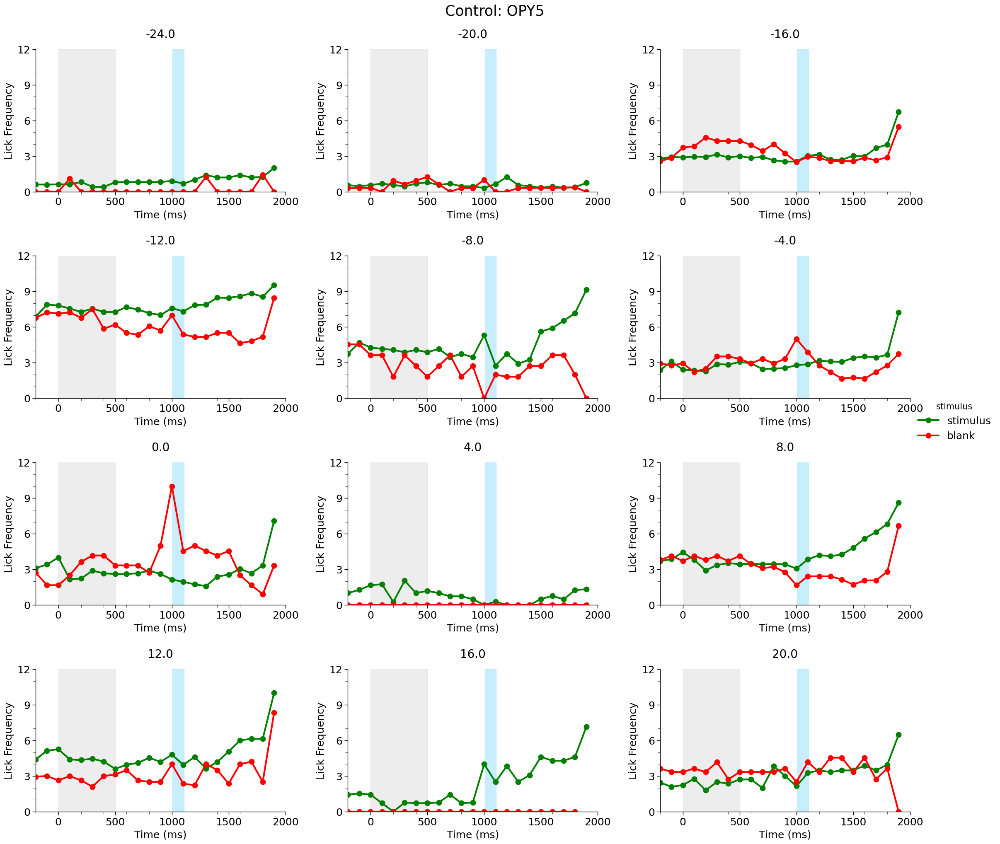

In [237]:
for a in filtmeans['animal'].unique():
    tmp = filtmeans[filtmeans['animal'] == a]
    if tmp['condition'].str.contains('Control').all():
        plot_lickfreq(tmp, suptitle=f'{tmp["condition"].unique()[0]}: {a}',
                    col_wrap=3,errorbar='se', err_style='bars', err_kws={'lw':0.7})

In [ ]:

p=["red", "green"]
ordr=["blank", "stimulus"]
tmp = filtmeans[filtmeans["condition"].str.contains('100')]
t = ((tmp["Time (hr)"] <= 4) & (tmp["Time (hr)"] >= -8))
for c in tmp["animal"].unique(): 
    plot_data = tmp[t & (tmp["animal"] == c)]
    if plot_data.empty:
        print(c)
    else: 
        plot_lickfreq(plot_data, suptitle=c, hue="stimulus", hue_order=ordr, 
            palette=p, col_wrap=3, legend=False )


In [ ]:
th = total_by_hour[(total_by_hour["Time (hr)"] <= 20) & (total_by_hour["Time (hr)"] >= 16)]
th.groupby(["condition", "Time (hr)"])["trial no"].mean().unstack(level="Time (hr)")

Time (hr),16.0,20.0
condition,,
"100% ACC, 80% SAT",108.785714,61.166667
Control,92.583333,77.000000
hM4Di + CNO,87.083333,38.375000
hM4Di + DCZ,97.222222,32.400000
mCherry + CNO,71.692308,41.111111
mCherry + DCZ,82.200000,28.500000


Performance (L<sub>stim</sub> - L<sub>blank</sub>) for entire trial, comparing
timebins together across groups

In [ ]:
time_bin = 4*60
data = lickfreq_analysis(df, freq_window, freq_bin, time_bin)
mean_statistics, counts, perf = aggregate_analysis(data, min_trials, min_blank_trials, min_water_trials, ["day_delta", "type"])

In [ ]:
num_bins = (len(filtperf[acc & cond]["Time (hr)"].unique()) + 1) * 2
num_bins

12

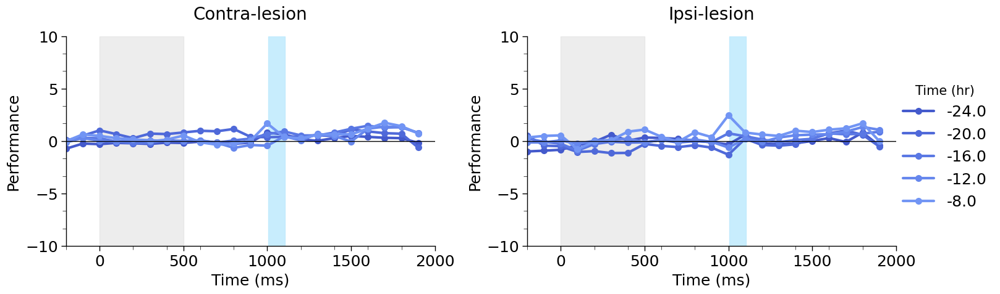

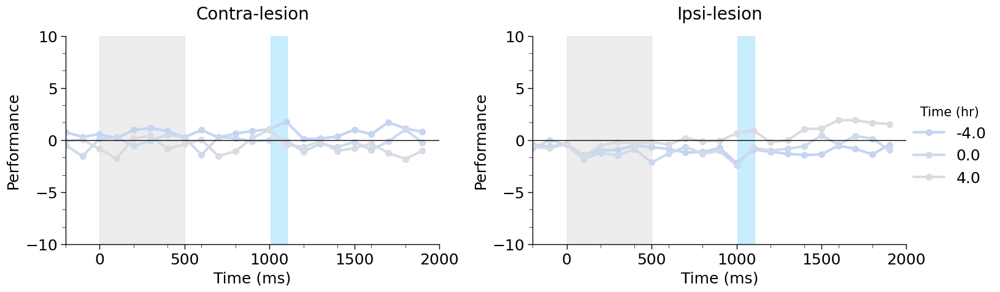

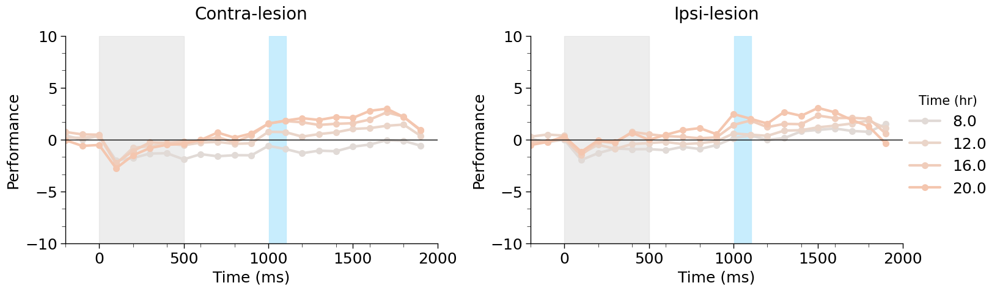

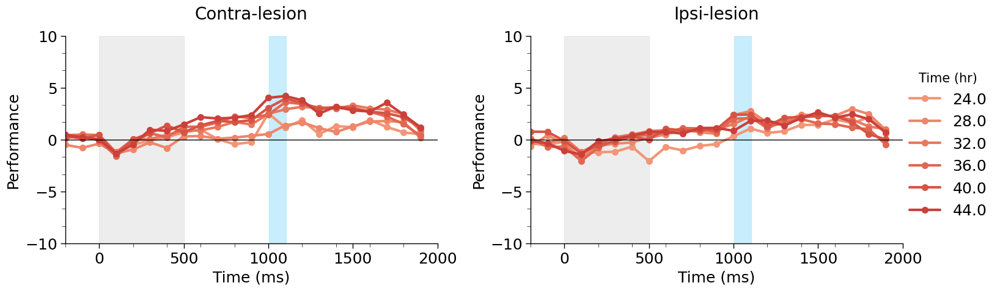

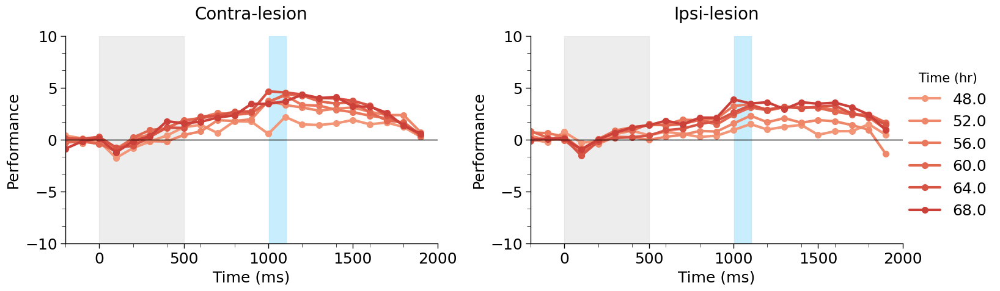

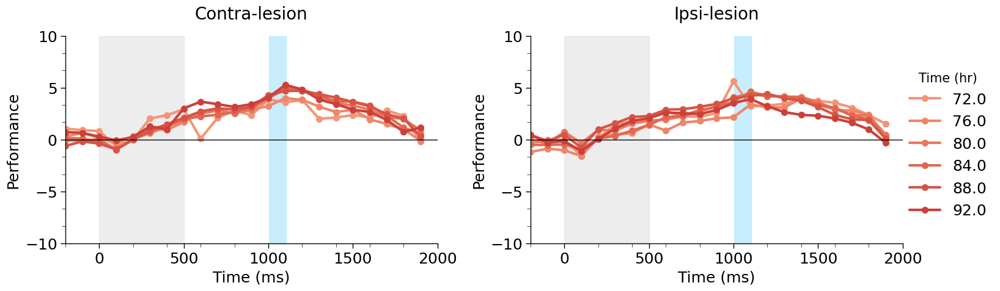

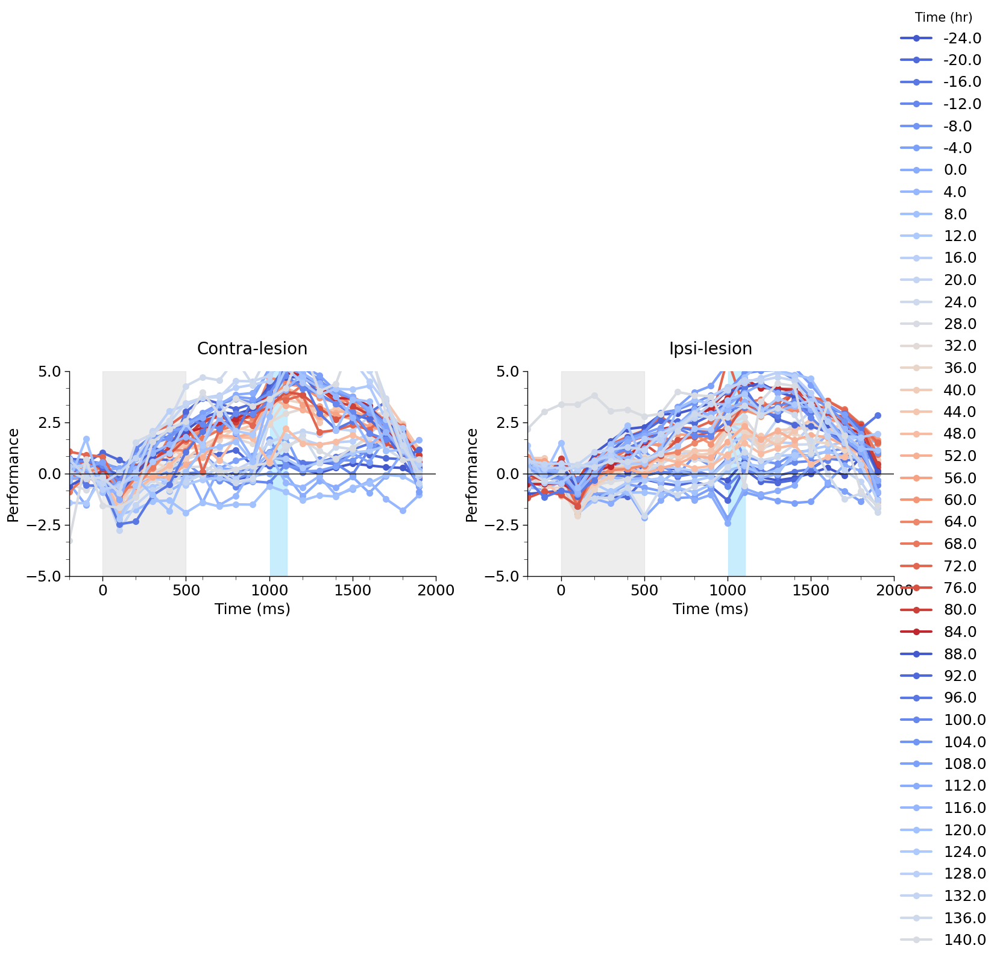

In [ ]:
cond = (filtperf['condition'].str.contains('lesion')) & (filtperf['Time (hr)'] < 144)
acc = ( (filtperf["Time (hr)"] < -4) )
early = ( (filtperf["Time (hr)"] < 8) & (filtperf["Time (hr)"] >= -4) )
late = ( (filtperf["Time (hr)"] >= 8) & (filtperf["Time (hr)"] < 24) )
day2 = ( (filtperf["Time (hr)"] >= 24) & (filtperf['Time (hr)'] < 48) )
day3 = ( (filtperf["Time (hr)"] >= 48) & (filtperf['Time (hr)'] < 72) )
day4 = ( (filtperf["Time (hr)"] >= 72) & (filtperf['Time (hr)'] < 96) )
ylim = [-5,5]
# ensures palette is centered around 0
num_bins = (len(filtperf[acc]["Time (hr)"].unique()) + 1) * 2
pl = sns.color_palette("coolwarm", n_colors=num_bins)

# 12 4h bins in ACC48 
plot_perf(filtperf[acc & cond], palette=pl[0:11],ms=8, col="condition")

# first 2 SAT timebins (SAT8)
plot_perf(filtperf[early & cond], palette=pl[11:14],ms=8, col="condition")

# rest of SAT
plot_perf(filtperf[late & cond], palette=pl[14:21],ms=8, col="condition")

plot_perf(filtperf[day2 & cond], palette=pl[21:],ms=8, col="condition")

plot_perf(filtperf[day3 & cond], palette=pl[21:],ms=8, col="condition")

plot_perf(filtperf[day4 & cond], palette=pl[21:],ms=8, col="condition")

# all together
plot_perf(filtperf[cond], palette=pl,ms=8, col="condition", ylim=ylim, legend='brief')


Performance (L<sub>stim</sub> - L<sub>blank</sub>) for entire trial, comparing
groups together across timebins

## 2.3 Lick frequency during Puff

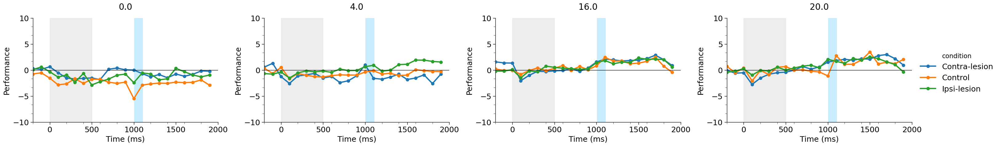

In [ ]:
p = [sat, all_reward, "goldenrod", "maroon", dcz_hm4di, dcz_mcherry]
ordr=["Control", "100% ACC, 80% SAT", "hM4Di + CNO", "mCherry + CNO", "hM4di + DCZ", "mCherry + DCZ"]
cond = (perf["Time (hr)"] == 0) | (perf["Time (hr)"] == 4) 
cond = cond | ((perf["Time (hr)"] == 16) | (perf["Time (hr)"] == 20) )
cond = cond & ((perf["condition"].str.contains("lesion")) | (perf["condition"].str.contains("Control")))

plot_perf(perf[cond], col="Time (hr)", hue="condition", ms=8, col_wrap=4, legend=True)

### 2.3.1 Lick frequency analysis

In [ ]:
r = (0, 300)
puff_data = bin_lickfreq_analysis(df, r, time_bin)

NameError: name 'bin_lickfreq_analysis' is not defined

In [ ]:
puff_mean_statistics, puff_counts, puff_perf = bin_aggregate_analysis(puff_data, min_trials, min_blank_trials, min_water_trials, ["type"])

In [ ]:
%history

counts[counts['animal'] == 'MJL2'][['Time (hr)', 'stimulus', 'trial no']].unstack(level='stimulus')
%load_ext autoreload
%autoreload 2
#python v3.11.3

import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)



import os
import datetime

import numpy as np #v1.25.0
import pandas as pd #v2.0.3
import scipy #v1.10.1
import scipy.stats as stats

import seaborn as sns #v0.13.0
import matplotlib as mpl #v3.8.1
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.dates as mdates

#import matplotlib.spines as spines
from matplotlib.patches import Rectangle
from matplotlib.collections import LineCollection

import importlib
# these files should be in the same directory as this Jupyter notebook
from loader import *
import analysis_functions
from analysis_functions import *
from plot_functions import *


### 2.3.2 Plotting

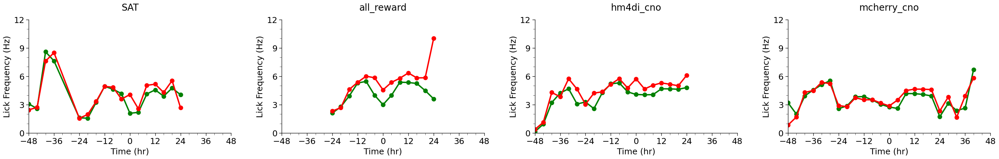

In [ ]:

plot_ant_lickfreq(puff_mean_statistics, legend=False, xlim=[-48, 48], col="condition")

## 2.4 Bout analysis


Bout boundaries are defined as 2 consecutive trials being more than 2 minutes
apart, based on visual investigation of raster plots of 
trial distributions of individual animals.

### 2.4.1 Analysis

In [ ]:
#r = (-200, 0)
#ant_data = bin_lickfreq_analysis(df, r, time_bin)
#ant_mean_statistics, counts, ant_perf = bin_aggregate_analysis(ant_data, min_trials, min_blank_trials, min_water_trials, ["Day", "day_delta", "type"])
data = get_bouts(data, ["animal"], "timestamp", "bout no", 2, "min")

In [ ]:
# calculate bout statistics

# metadata
keep = data.groupby(["animal", "bout no"]).last()[["condition", "age", "sex", "strain", "cage", "Time (hr)", "stimulus"]]

# bout length (time of last sample in bout - time of first sample in bout)
bout_start = data.groupby(["animal", "bout no"]).first()["timestamp"] 
bout_end = data.groupby(["animal", "bout no"]).last()["timestamp"]
bout_end_identity = data.groupby(["animal", "bout no"]).last()[["timestamp","stimulus"]]
bout_len = (bout_end - bout_start).rename("bout len")

# intra bout iti (first sample of trial - last sample of previous trial)
intra_bt_trial_start = data.groupby(["animal", "bout no", "trial no"]).first()["timestamp"]
intra_bt_trial_end = data.groupby(["animal", "bout no", "trial no"]).last()["timestamp"]
intra_bt_iti = (intra_bt_trial_start - intra_bt_trial_end.groupby(["animal", "bout no"]).shift()).rename("intra bout iti")
intra_bt_iti = intra_bt_iti.groupby(["animal", "bout no"]).mean()
num_trials = intra_bt_trial_start.groupby(["animal", "bout no"]).count().rename("num trials")

# inter bout interval (first sample in bout - last sample in previous bout)
ibi = (bout_start - bout_end.groupby(["animal"]).shift()).rename("ibi")

# concat stats and metatdata together
bout_stats = pd.concat([keep, bout_len, ibi, intra_bt_iti, num_trials], axis=1).reset_index()

# convert to float
# handle NaT (i.e. first trial in bout for iti and ibi) by setting to -1 then 
# resetting all values less than 1 to NA 
# (hacky, but works because no iti or ibi should ever be < 0)
bout_stats["bout len"] = bout_stats["bout len"].to_numpy(dtype="timedelta64[ms]").astype("float")/(1000.)
bout_stats["ibi"] = bout_stats["ibi"].to_numpy(dtype="timedelta64[m]", na_value=-1).astype("float")/60.
bout_stats.loc[bout_stats["ibi"] < 0,"ibi"] = pd.NA
bout_stats["intra bout iti"] = bout_stats["intra bout iti"].to_numpy(dtype="timedelta64[ms]", na_value=-1).astype("float")/1000.
bout_stats.loc[bout_stats["intra bout iti"] < 0,"intra bout iti"] = pd.NA

# calculate trial frequency (number of trials/length of bout)
bout_stats["frequency"] = bout_stats["num trials"]/bout_stats["bout len"]

### 2.4.2 Plotting

Bout length

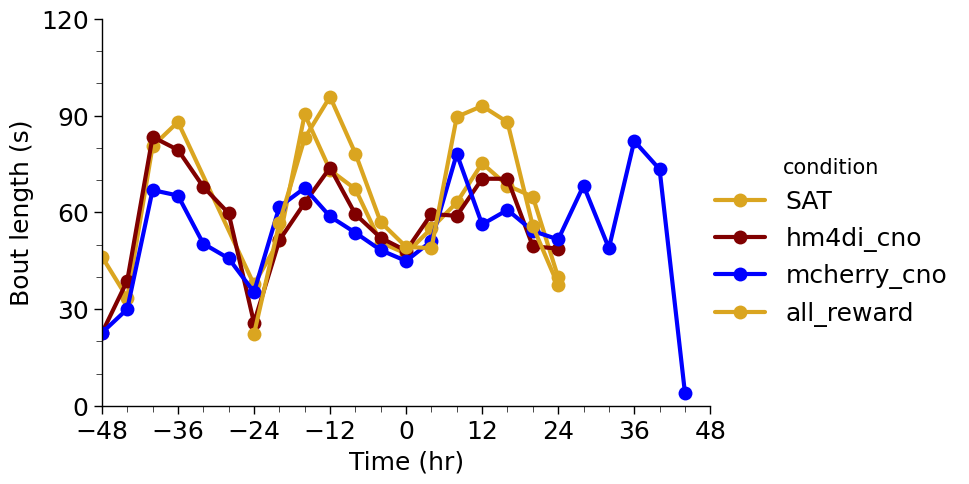

In [ ]:
p = ["goldenrod", "maroon", 'b']
ordr=["hm4di", "mcherry", "SAT"]

plot_hr(bout_stats, y="bout len", col=None, hue="condition",
              ylim=[0, 120], xlim=[-48, 48],palette=p, ylabel="Bout length (s)")

Inter bout interval

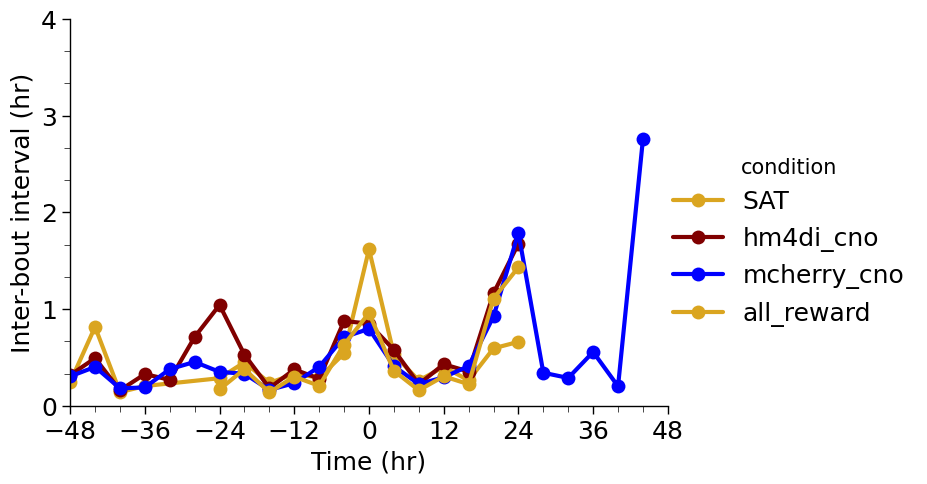

In [ ]:
plot_hr(bout_stats, y="ibi", hue="condition", col=None, 
              ylim=[0, 4],xlim=[-48, 48], palette=p, ylabel="Inter-bout interval (hr)")

Intra-bout inter trial interval

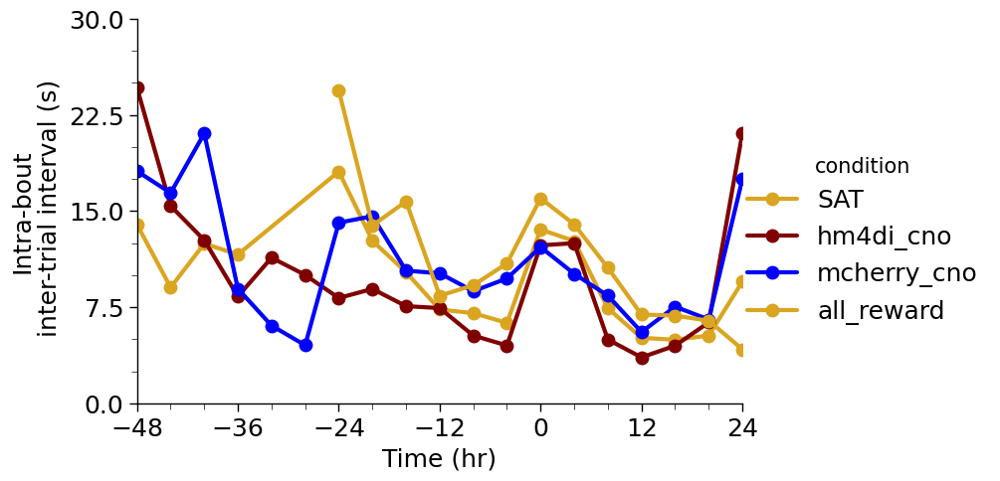

In [ ]:
plot_hr(bout_stats, y="intra bout iti", hue="condition", col=None, 
              ylim=[0, 30], palette=p,ylabel="Intra-bout\n inter-trial interval (s)" )

Number of trials per bout

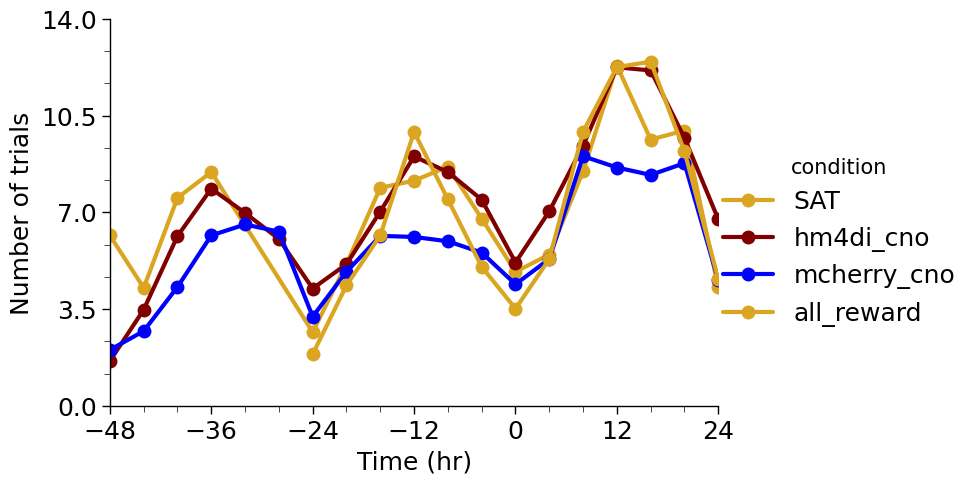

In [ ]:
plot_hr(bout_stats, y="num trials", hue="condition", col=None, 
              ylim=[0, 14], palette=p, ylabel="Number of trials")

Intra-bout trial frequency

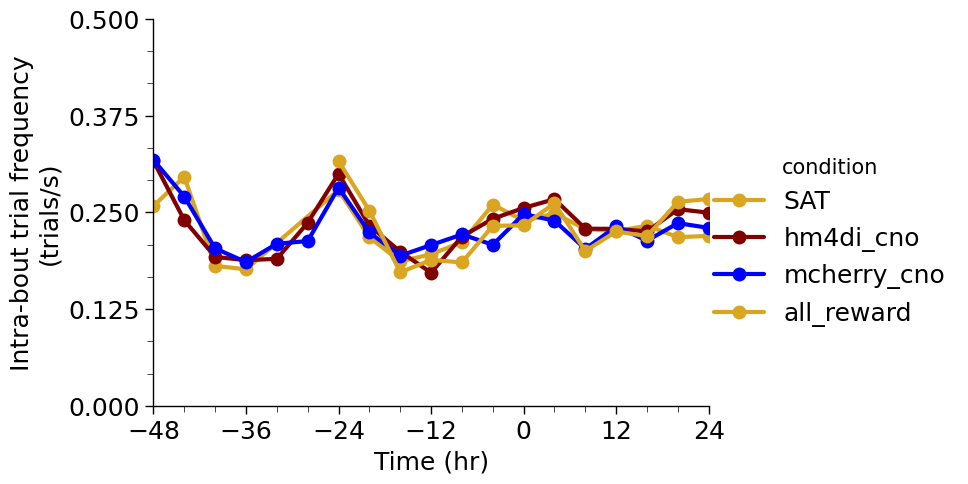

In [ ]:
plot_hr(bout_stats, y="frequency", hue="condition", col=None, 
              ylim=[0, 0.5], palette=p, ylabel="Intra-bout trial frequency\n(trials/s)")

## 2.5 Anticipatory licking based on previous trial identity

Splitting data based on whether the previous trial was stimulus or blank. 
Using bout labeling to ensure that previous trials are consecutive.

### 2.5.1 Analysis

In [ ]:
trial_ind = ["animal", "trial no"]
bout_ind = ["animal", "bout no"]
key = "stimulus"
n = 1
cond0 = "stimulus"
cond1 = "blank"
data = get_n_back(data, trial_ind, bout_ind, key, n, cond0, cond1)

untested for `n` $\geq$ `1`

In [ ]:
def agg_by_prev_trial(data, agg_data, n, min_trials, min_blank_trials, min_water_trials, keep):
    mean_statistics, counts, perf = agg_data
    mean_statistics["n_back"] = 0
    counts["n_back"] = 0
    perf["n_back"] = 0

    mean_statistics["back_type"] = "none"
    counts["back_type"] = "none"
    perf["back_type"] = "none"

    for i in range(1, n+1):
        cname = f'{i}_back'
        stimcond = data[cname] == "stimulus"
        bcond = data[cname] == "blank"
        for j in range(1, i):
            cname = f'{j}_back'
            stimcond = stimcond & (data[cname] == "stimulus")
            bcond = bcond & (data[cname] == "blank")
        prev_stim = data[data[cname] == "stimulus"]
        prev_blank = data[data[cname] == "blank"]

        ps_data = aggregate_analysis(prev_stim, min_trials, min_blank_trials, 
                                     min_water_trials, keep)
        ps_data = set_prev_info(ps_data, i, "stimulus")
        ps_mean, ps_counts, ps_perf = ps_data
        

        pb_data = aggregate_analysis(prev_blank, min_trials, min_blank_trials, 
                                     min_water_trials, keep)
        pb_data = set_prev_info(pb_data, i, "blank")
        pb_mean, pb_counts, pb_perf = pb_data
        

        mean_statistics = pd.concat([mean_statistics, ps_mean, pb_mean])
        counts = pd.concat([counts, ps_counts, pb_counts])
        perf = pd.concat([perf, ps_perf, pb_perf])
        return mean_statistics, counts, perf

In [ ]:
# TODO: increase number of previous trials to label
n = 1
mean_w_prev, counts_w_prev, perf_w_prev = agg_by_prev_trial(data, (mean_statistics, counts, perf), n, min_trials, min_blank_trials, min_water_trials, ["type"])

In [ ]:
# number of trials per bout
f = data.groupby(["condition", "animal", "Time (hr)", "bout no", "trial no"]).first().reset_index()

counts_prev = f.groupby(["condition","animal", "Time (hr)", "bout no", "stimulus", "1_back"]).count()
cts_gp = counts_prev.groupby(["condition", "animal", "Time (hr)", "stimulus", "1_back"])
mean_prev = cts_gp.mean().reset_index()
total_prev = cts_gp.sum().reset_index()

counts_stim = f.groupby(["condition","animal", "Time (hr)", "bout no", "stimulus"]).count()
cts_gp = counts_stim.groupby(["condition", "animal", "Time (hr)", "stimulus"])
mean_stim = cts_gp.mean().reset_index()
total_stim = cts_gp.sum().reset_index()

counts_all = f.groupby(["condition","animal", "Time (hr)", "bout no"]).count()
mean_all = counts_all.groupby(["condition", "animal", "Time (hr)"]).mean().reset_index()

### 2.5.2 Plotting

In [ ]:
# anticipatory licking by previous trial contingency
ant = mean_w_prev[(mean_w_prev["Time (ms)"] == 100)] 

h = ant[['stimulus', 'back_type']].apply(tuple, axis=1)
p = ["xkcd:light pink", "xkcd:greyish", 
     "xkcd:burgundy",   "xkcd:dark forest green", 
     "xkcd:magenta",    "xkcd:turquoise green"]
ordr = [('blank', 'none'),     ('stimulus', 'none'), 
        ('blank', 'stimulus'), ('stimulus', 'stimulus'), 
        ('blank', 'blank'),    ('stimulus', 'blank')]
plot_hr(ant, col="condition", hue="back_type", palette=["black", "green", "red"],
        ylim=[0, 12], xlim=[-48, 48])
c = (ant["condition"] != "all_reward") & (ant["condition"] != "mcherry_cno")
h = ant[c][['stimulus', 'back_type']].apply(tuple, axis=1)

plot_hr(ant[c], col="condition",row="back_type", hue=h, palette=p, hue_order=ordr, 
        ylim=[0, 12.5], ylabel="Licking Frequency\nBefore Puff")

In [ ]:
# anticipstory licking by previous trial contingency blank vs blank and stim vs stim
cond = (mean_w_prev["n_back"] < 2) & (mean_w_prev["back_type"] != "none") & (mean_w_prev["condition"] != "all_reward")
h = mean_w_prev[cond][['stimulus', 'back_type']].apply(tuple, axis=1)

plot_hr(mean_w_prev[cond], col="condition", row="stimulus", hue=h, palette=p, 
        hue_order=ordr, ylim=[0, 8], ylabel="Licking Frequency", xlim=[-4, 24])

In [ ]:
cond = ( (mean_w_prev["Time (hr)"] <= 48) & (mean_w_prev["Time (hr)"] >= -4) 
       & (mean_w_prev["n_back"] < 2) & (mean_w_prev["back_type"] != "none")
       #& (mean_w_prev["puff delta"] < 1000) 
       )

for condition in mean_w_prev["condition"].unique(): 
    plot_data = mean_w_prev[cond & (mean_w_prev["condition"] == condition)]
    h = plot_data[['stimulus', 'back_type']].apply(tuple, axis=1)
    plot_lickfreq(plot_data, suptitle=condition, hue=h, hue_order=ordr, 
                  palette=p, xlim=[-200, 1000])

In [ ]:
h = mean_prev[['1_back', 'stimulus']].apply(tuple, axis=1)
p = ["xkcd:burgundy", "xkcd:dark forest green", "xkcd:magenta", "xkcd:turquoise green"]
ordr = [('stimulus', 'blank'),
       ('stimulus', 'stimulus'), ('blank', 'blank'),
       ('blank', 'stimulus')]

# mean number of trials per bin
plot_trial_hr(mean_prev, hue=h, palette=p, hue_order=ordr, ylim=[0, 15], 
              fill=False)

# total number of trials per bin
plot_trial_hr(total_prev, hue=h, palette=p, hue_order=ordr, ylim=[0, 150],
              fill=False)

In [ ]:
total_prev[total_prev["Time (hr)"] > 0].groupby(["condition", "1_back", "stimulus", "Time (hr)"])["trial no"].mean().unstack(level="Time (hr)")

Time (hr)                           4.0         8.0        12.0       16.0  \
condition   1_back   stimulus                                                
SAT         blank    blank      2.285714    4.583333   4.272727   3.222222   
                     stimulus   5.900000   19.538462  17.571429  11.615385   
            stimulus blank      7.666667   20.769231  19.230769  13.000000   
                     stimulus  39.444444   85.357143  73.714286  51.230769   
all_reward  blank    blank      2.111111    6.714286   4.714286   4.800000   
                     stimulus   9.307692   28.071429  20.285714  15.142857   
            stimulus blank      9.166667   27.571429  22.071429  15.071429   
                     stimulus  45.272727  107.285714  95.928571  66.285714   
hm4di_cno   blank    blank      3.000000    5.000000   4.583333   2.600000   
                     stimulus   8.181818   20.250000  16.250000  11.750000   
            stimulus blank      8.181818   20.916667  16.666667  12.000000   
                     stimulus  34.454545   82.916667  59.916667  54.000000   
mcherry_cno blank    blank      2.818182    5.214286   3.363636   3.100000   
                     stimulus   7.428571   17.357143  13.785714   8.615385   
            stimulus blank      8.142857   18.428571  14.642857   8.384615   
                     stimulus  34.307692   78.285714  52.857143  43.846154   

Time (hr)                           20.0       24.0  28.0  32.0  36.0  40.0  \
condition   1_back   stimulus                                                 
SAT         blank    blank      3.500000   2.000000   NaN   NaN   NaN   NaN   
                     stimulus  10.142857   3.000000   NaN   NaN   NaN   NaN   
            stimulus blank     10.714286   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  45.285714   5.000000   NaN   NaN   NaN   NaN   
all_reward  blank    blank      1.666667        NaN   NaN   NaN   NaN   NaN   
                     stimulus   6.833333   3.000000   NaN   NaN   NaN   NaN   
            stimulus blank      6.428571   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  27.666667   5.600000   NaN   NaN   NaN   NaN   
hm4di_cno   blank    blank      2.000000   1.500000   NaN   NaN   NaN   NaN   
                     stimulus   5.250000   2.500000   NaN   NaN   NaN   NaN   
            stimulus blank      5.375000   3.000000   NaN   NaN   NaN   NaN   
                     stimulus  21.333333  13.500000   NaN   NaN   NaN   NaN   
mcherry_cno blank    blank      2.500000   1.000000   4.0   7.0   4.0   4.0   
                     stimulus   4.777778   1.333333  13.0  16.0  11.0  14.0   
            stimulus blank      5.777778   2.666667  15.0  15.0  13.0  17.0   
                     stimulus  21.181818   6.250000  79.0  72.0  67.0  53.0   

Time (hr)                      44.0  
condition   1_back   stimulus        
SAT         blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
all_reward  blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
hm4di_cno   blank    blank      NaN  
                     stimulus   NaN  
            stimulus blank      NaN  
                     stimulus   NaN  
mcherry_cno blank    blank      NaN  
                     stimulus   1.0  
            stimulus blank      NaN  
                     stimulus   NaN

## 2.6 Slope

In [ ]:
# lick freq slope across trial - y2 - y1 / (x2- x1)
# (x2-x1 will always == 100ms because of sampling)
# so this should be lickfreq.diff()/100
def getSlopes(data, filt, r, samplerate):
    slopes = data.copy()
    if r != None:
        rangefilt = (data["Time (ms)"] > r[0]) & (data['Time (ms)']  <= r[1])
        slopes = data[rangefilt]
    if not filt.empty:
        slopes = slopes[filt]
    slopes = slopes.set_index(['condition', 'animal', 'Time (hr)', 'Time (ms)', 'stimulus'])
    # get slope for each animal for each time bin
    # (diff = y2 - y1, samplerate (should be constant) = x2 - x1)
    slopes = slopes.groupby(['condition', 'animal', 'Time (hr)', 'stimulus'])['lick'].diff()/samplerate
    slopes = slopes.reset_index()
    # mean slope across time range
    slopes = slopes.groupby(['condition', 'animal','stimulus','Time (hr)']).mean().reset_index()
    return slopes

Text(0.5, 0.98, 'pre-puff')

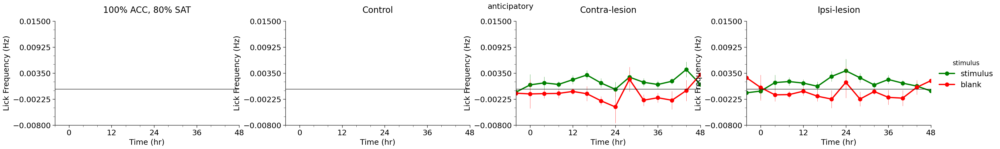

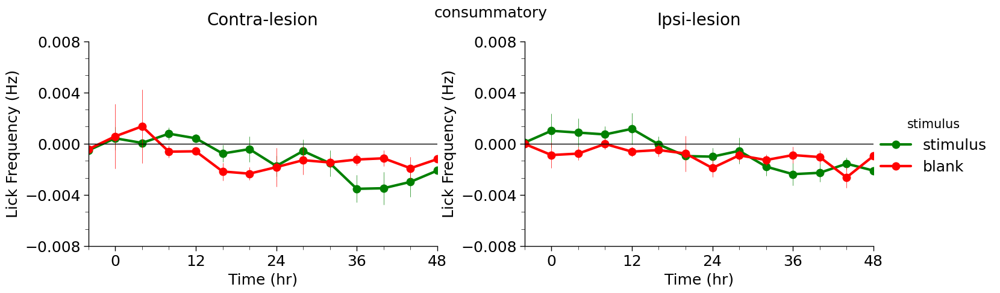

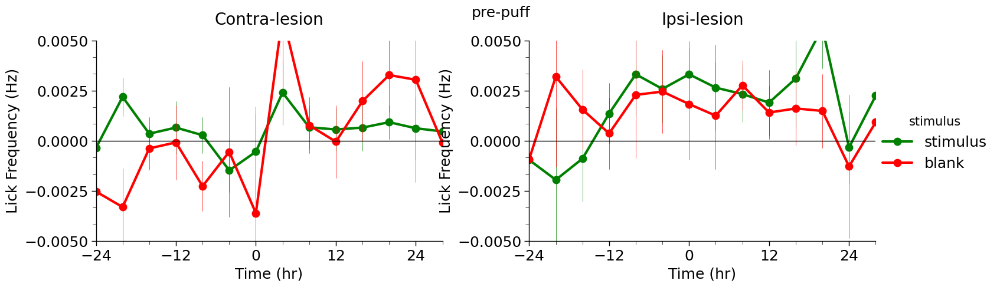

In [ ]:
# separate consummatory and anticipatory slope - whole trial slope doesn't show difference because animals are doing something different in anticipatory and consummatory periods
# and whole trial slope collapses that information
# slopes by animal 
cond = (filtmeans['condition'].str.contains('lesion')) #| (filtmeans['condition'] == 'Control') | (filtmeans['condition'].str.contains('100%'))# | (filtmeans['condition'].str.contains('hM4Di'))
# group by animal by timebin, get difference between tw
#slopes = getSlopes(filtmeans, cond, None, 100)
#g = plot_ant_lickfreq(slopes, ylim=[-0.0025, 0.0025], xlim=[-24, 28], errorbar='se', err_style='bars', err_kws={'lw':0.5})
#for (n,ax) in g.axes_dict.items():
#     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
#g.fig.suptitle('whole trial')

slopesant = getSlopes(filtmeans, cond, (500, 1000), 100)
slopesant['slope type'] = 'anticipatory'
g = plot_ant_lickfreq(slopesant, ylim=[-0.008, 0.015], xlim=[-4, 48], errorbar='se', err_style='bars', err_kws={'lw':0.5}#,col_order=['100% ACC, 80% SAT','Control', 'Contra-lesion', 'Ipsi-lesion'])
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('anticipatory')

slopescon = getSlopes(filtmeans, cond, (1000, 1700), 100)
slopescon['slope type'] = 'consummatory'
g = plot_ant_lickfreq(slopescon, ylim=[-0.008, 0.008], xlim=[-4, 48], errorbar='se',err_style='bars', err_kws={'lw':0.5})
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('consummatory')

slopespre = getSlopes(filtmeans, cond, (-300, 0), 100)
slopespre['slope type'] = 'pre-puff'
g = plot_ant_lickfreq(slopespre, ylim=[-0.005, 0.005], xlim=[-24, 28], errorbar='se',err_style='bars', err_kws={'lw':0.5})
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('pre-puff')

#slopesnext = getSlopes(filtmeans, cond, (1800, 2000), 100)
#slopesnext['slope type'] = 'next trial anticipatory'
#g = plot_ant_lickfreq(slopesnext, ylim=[-0.005, 0.05], xlim=[-24, 28], errorbar='se',err_style='bars', err_kws={'lw':0.5},col_wrap=4)
#for (n,ax) in g.axes_dict.items():
#     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
#g.fig.suptitle('next trial anticipatory')

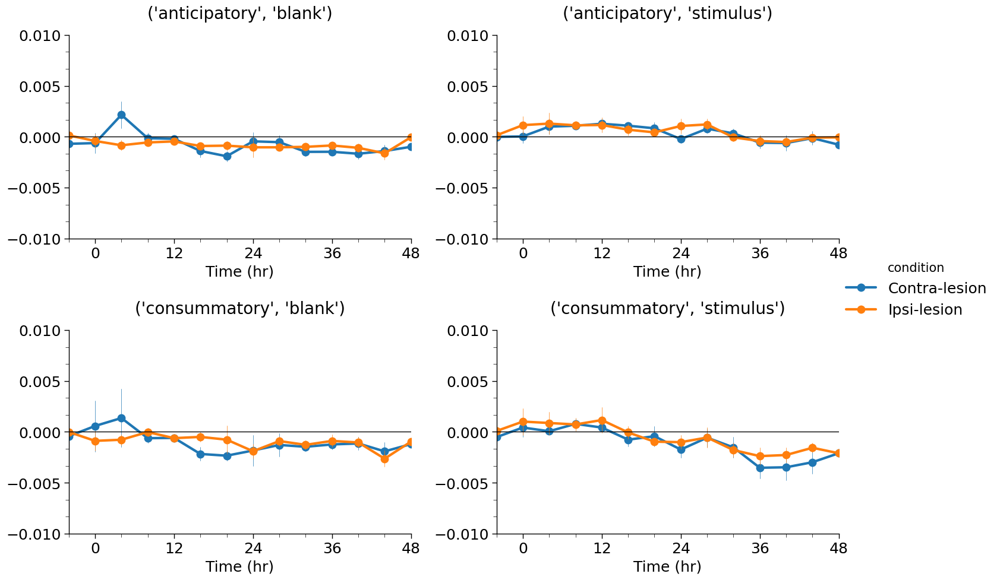

In [ ]:
slopesall = pd.concat([slopesant, slopescon])
g = plot_ant_perf(slopesall, hue='condition', col='stimulus', row='slope type',ylim=[-0.01, 0.01], xlim=[-4, 48], errorbar='se',err_style='bars', err_kws={'lw':0.5})
#for (n,ax) in g.axes_dict.items():
#     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)


slopes by 1 hour bins _check alignment - more imporant for 1h than for 4h_

change drop threshold for 1h bins? (fewer trials per bin overall - still up to 30-70 trials in good bins)

In [ ]:
# keys["millis bin"] = "puff delta"
# time_bin = 1*60 # minutes

# data1h = full_lickfreq(df, freq_window, freq_bin, time_bin, keys, keep, values)

# flkeep = keep + ["Time (hr)", "delta", "Day", "day_delta", "puff delta", "Time (ms)"]

# keys["time bin"] = "delta"
# means1h, flcounts1h, perf1h = agg(data1h, keys, index, flkeep, values)
# daytots = sum_trials(flcounts1h, index + ["Day"],[], "trial no")
# hourtots = sum_trials(flcounts1h, index + ["Time (hr)"],[], "trial no")

mins["min_trials"] = 10 # minimum number of trials in a bin to keep
mins["min_blank"] = 1 # minimum number of water trials
mins["min_stimulus"] = 1 # minimum number of water trials

data_filtered1h = drop_group(data1h, mins, keys, "trial no", index, flkeep)
filtmeans1h, flfiltcounts1h, filtperf1h = agg(data_filtered1h, keys, index, flkeep, values)
daytotsfilt1h = sum_trials(flfiltcounts, index + ["Day"],[], "trial no")
hourtotsfilt1h = sum_trials(flfiltcounts, index + ["Time (hr)"], [],"trial no")

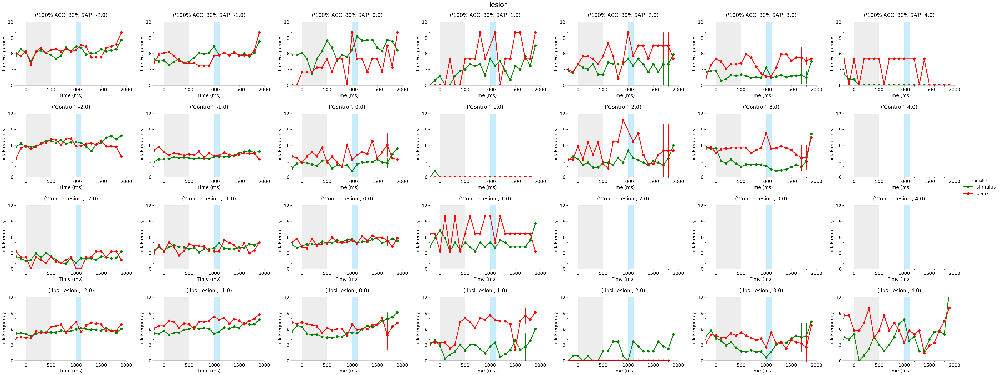

In [ ]:
#filtmeans['Time (hr)'] = filtmeans['Time (hr)'] + 2
#for c in filtmeans['condition'].unique():
plot_lickfreq(filtmeans1h[((filtmeans1h['condition'].str.contains('lesion')) | (filtmeans1h['condition'] == 'Control') | (filtmeans1h['condition'].str.contains('100%'))) & (filtmeans1h['Time (hr)'] >=-2) & (filtmeans1h['Time (hr)'] <=4)],
              row='condition', suptitle="lesion", row_order=['100% ACC, 80% SAT','Control', 'Contra-lesion', 'Ipsi-lesion'],
              col_wrap=None,errorbar='se', err_style='bars', err_kws={'lw':0.7})


Text(0.5, 0.98, 'pre-puff')

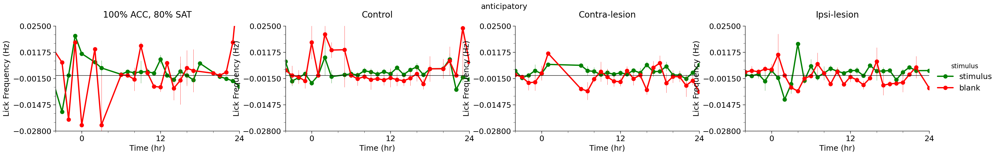

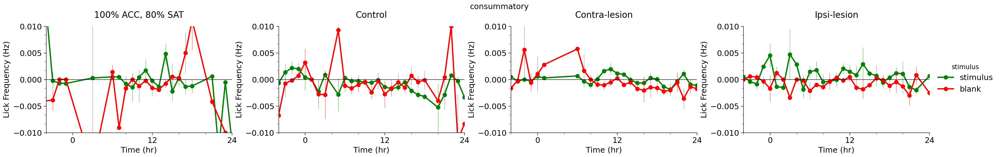

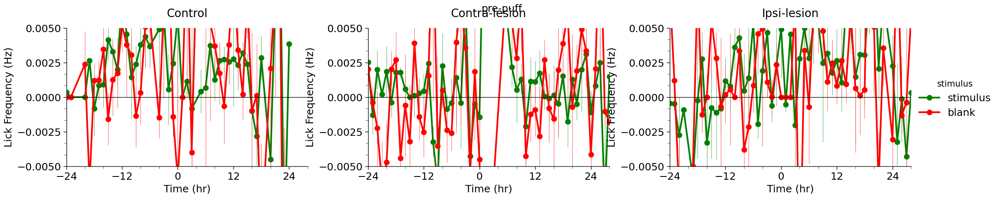

In [ ]:
# separate consummatory and anticipatory slope - whole trial slope doesn't show difference because animals are doing something different in anticipatory and consummatory periods
# and whole trial slope collapses that information
# slopes by animal 
cond = (filtmeans1h['condition'].str.contains('lesion')) | (filtmeans1h['condition'] == 'Control') | (filtmeans['condition'].str.contains('100')) #| (filtmeans['condition'].str.contains('hM4Di'))
# group by animal by timebin, get difference between tw
#slopes = getSlopes(filtmeans, cond, None, 100)
#g = plot_ant_lickfreq(slopes, ylim=[-0.0025, 0.0025], xlim=[-24, 28], errorbar='se', err_style='bars', err_kws={'lw':0.5})
#for (n,ax) in g.axes_dict.items():
#     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
#g.fig.suptitle('whole trial')

slopesant = getSlopes(filtmeans1h, cond, (600, 1000), 100)
slopesant['slope type'] = 'anticipatory'
g = plot_ant_lickfreq(slopesant, ylim=[-0.028, 0.025], xlim=[-4, 24], errorbar='se', err_style='bars', err_kws={'lw':0.5}, col_order=['100% ACC, 80% SAT', 'Control', 'Contra-lesion', 'Ipsi-lesion'])
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('anticipatory', y=1.01)

slopescon = getSlopes(filtmeans1h, cond, (1000, 1700), 100)
slopescon['slope type'] = 'consummatory'
g = plot_ant_lickfreq(slopescon, ylim=[-0.01, 0.01], xlim=[-4, 24], errorbar='se',err_style='bars', err_kws={'lw':0.5},col_order=['100% ACC, 80% SAT', 'Control', 'Contra-lesion', 'Ipsi-lesion'])
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('consummatory',y=1.01)

slopespre = getSlopes(filtmeans1h, cond, (-300, 0), 100)
slopespre['slope type'] = 'pre-puff'
g = plot_ant_lickfreq(slopespre, ylim=[-0.005, 0.005], xlim=[-24, 28], errorbar='se',err_style='bars', err_kws={'lw':0.5},col_order=['Control', 'Contra-lesion', 'Ipsi-lesion'])
for (n,ax) in g.axes_dict.items():
     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
g.fig.suptitle('pre-puff')

#slopesnext = getSlopes(filtmeans, cond, (1800, 2000), 100)
#slopesnext['slope type'] = 'next trial anticipatory'
#g = plot_ant_lickfreq(slopesnext, ylim=[-0.005, 0.05], xlim=[-24, 28], errorbar='se',err_style='bars', err_kws={'lw':0.5},col_wrap=4)
#for (n,ax) in g.axes_dict.items():
#     ax.axhline(y=0, xmin=0, xmax=1, ls="-", color="black", zorder=10, lw=1)
#g.fig.suptitle('next trial anticipatory')

# 4. Output Results 

This will overwrite any previous output in the same folder, so make sure to 
move files or change the output directory if running the code multiple times.

### 4.1 Aggregate data

In [ ]:
# output_dir = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\refactor_4h'
# cols = ["condition", "animal", "stimulus", "Time (hr)", "Time (ms)", "lick"]
# mean_statistics.to_excel(f'{output_dir}lick_frequency.xlsx', columns=cols, index=False)

# cols = ["condition", "animal", "Time (hr)", "stimulus", "trial no"]
# counts.to_excel(f'{output_dir}trial_counts.xlsx', columns=cols, index=False)

# cols = ["condition", "animal", "Time (hr)", "Time (ms)", "lick"]
# perf.to_excel(f'{output_dir}performance.xlsx', columns=cols, index=False)

# with open(f'{output_dir}parameters.txt', mode='w') as f:
#     out = f'''csv_directory = {csv_directory}
# metadata_file = {metadata_file}
# default_acc_time = {default_acc_time} days

# time_bin = {time_bin} minutes
# freq_window = {freq_window} milliseconds, length of rolling window
# freq_bin = {freq_bin} milliseconds, length of discrete time bin

# min_trials = {min_trials} minimum number of trials in a bin to keep
# min_water_trials = {min_water_trials} minimum number of water trials
# min_blank_trials = {min_blank_trials} minimum number of water trials
# '''
#     f.write(out)

### 4.2 Raw lick frequency data

Takes a long time to run due to large number of samples 
(there are ~40k rows per animal)

In [ ]:
# raw data has too many lines to output to excel
# large number of samples means this takes a long time (~6s for 4 animals)
data.to_csv(f'{output_dir}rawlickfrequency.csv', index=False)

NameError: name 'output_dir' is not defined

# 5. Pipeline description

__Pipeline:__

>```
>raw data (csv) ------------|    loader.py                                                     lickfreq_analysis                                            
>                            |------------------> formatted data - many animals (dataframe) ---------------------------> trial-level analysis(dataframe)
>metadata (excel) ----------|
>
>                                     aggregate_analysis   |---> trial number counts by timebin and condition (dataframe) ---|
>trial-level analysis (dataframe) ------------------------|---> mean lick frequency by timebin (dataframe) -----------------|---> plots
>                                                          |---> performance by timebin (dataframe) -------------------------|
>```

***

__Formats__

*raw data*

>time (ms), poke, lick, condition code, delay, stimulus

- time measured from start of file
- poke in {0, 1}
- lick in {0, 2}
- condition code in {3, 4, 5, 7, 9}
    - 3 = delay
    - 4 = air delivery
    - 5 = water delivery
    - 7 = after water delivery
    - 9 = blank
- 200 <= delay <= 800
- stimulus in {0, 1}
    - stimulus not present in SAT code
    - stimulus present and relevant in pseudo code

*metadata*

- excel
- must include 'Animal ID' (3 letter + number animal code)
- must include 'acc' (time of acclimation in days)
- other example columns: age, sex, strain

*formatted data*

>timestamp, poke, lick, condition code, delay, trial no, water, stimulus, animal, condition, metadata

- metadata can be multiple columns

*trial-level analysis*
> condition, animal, trial no, puff delta, trial start, timestamp, metadata, stimulus, water, lick, poke, delta, time (hr), time (ms)

- puff delta is equivalent to time (ms)
    - represents timestamp normalized to air delivery
    - puff delta is timedelta and time (ms) is float
- trial start represents timebin as timestamp
- delta is equivalent to time (hr)
    - represents timebin normalized to start of stat
    - delta is timedelta and time (hr) is float
- metadata can be multiple columns
- lick and poke now represent frequencys aggregated based on given window size

